# House price advance regression techniques:-
Problem ststment:
The goal of this project is to use EDA, visualization, data cleaning, preprocessing and linear models to predict home prices. We give the features of the houses and interpret the models to find out what features add value to a home.

The data is originally taken from Kaggle.
*  In this data set every aspect of residential homes in Ames, Iowa was described with (almost) 79 explanatory variables, After this project we can easily understand and predict which aspect can affect the final price of each house.

Exploratory Data Analysis (EDA)
As with any data exercise, we begain with some Exploratory Data Analysis.

1.Numerical variables:
   There are 36 relevant numerical features.which "identifies the type of residential-building involved in the sale", is encoded as numeric but is in reality a categorical variable.
   There are 36 numerical features, of the following types:

    Square footage: Indicates the square footage of certain features, i.e. 1stFlrSF (First floor square footage) and GarageArea (Size of garage in square feet).
    
    Time: Time related variables like when the home was built or sold.
    
    Room and amenties: data that represent amenties like “How many bathrooms?”
    
    Condition and quality: Subjective variables rated from 1–10.
   
2.Categorical Variables:

    Similar to the numeric features, there is a range of categorical features.
    It includes the presence or absence of central air, the neighborhood, the external quality,
    zoning, roof style, land slope and so on.
    
Process:
    With a better sense of the data, we’re now able to go through and do some analysis on the data.
    
    Pre-processing:
    Before running our model on the data, we need to transform several variables. Therefore we will       implement the following pre-processing steps:
    
    * Check duplicated data.
    * Identify and Remove outliers.
    * Treat NaN values.
    * Create dummy variables.
    * Visualization.
    * Feature scaling.


In [1]:
# Importing required libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
#Uploading data set
df=pd.read_csv('train.csv',encoding='UTF-8')
df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [3]:
#checking last 5 rows
df.tail()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
1455,1456,60,RL,62.0,7917,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,8,2007,WD,Normal,175000
1456,1457,20,RL,85.0,13175,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,2,2010,WD,Normal,210000
1457,1458,70,RL,66.0,9042,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,GdPrv,Shed,2500,5,2010,WD,Normal,266500
1458,1459,20,RL,68.0,9717,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,4,2010,WD,Normal,142125
1459,1460,20,RL,75.0,9937,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,6,2008,WD,Normal,147500


In [4]:
#checking shape of data set
df.shape

(1460, 81)

In [68]:
df.size

118260

In [69]:
#checking cloumns informmation 
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [7]:
df.columns

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDrive

In [8]:
df.head(10)

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000
5,6,50,RL,85.0,14115,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,MnPrv,Shed,700,10,2009,WD,Normal,143000
6,7,20,RL,75.0,10084,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,8,2007,WD,Normal,307000
7,8,60,RL,NaN,10382,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,Shed,350,11,2009,WD,Normal,200000
8,9,50,RM,51.0,6120,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,4,2008,WD,Abnorml,129900
9,10,190,RL,50.0,7420,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,1,2008,WD,Normal,118000


In [9]:
df.sample(100)

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
1424,1425,20,RL,NaN,9503,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,GdWo,NaN,0,6,2007,WD,Normal,144000
289,290,70,RL,60.0,8730,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,7,2007,WD,Normal,153575
1217,1218,20,FV,72.0,8640,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2009,New,Partial,229456
789,790,60,RL,NaN,12205,Pave,NaN,IR1,Low,AllPub,...,0,NaN,NaN,NaN,0,7,2007,WD,Normal,187500
508,509,70,RM,60.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,10,2008,WD,Normal,161000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
622,623,20,RL,71.0,7064,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,7,2009,WD,Normal,135000
1273,1274,80,RL,124.0,11512,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,GdPrv,NaN,0,5,2008,WD,Normal,177000
969,970,190,RL,75.0,10382,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,3,2006,ConLD,Normal,140000
1270,1271,40,RL,NaN,23595,Pave,NaN,Reg,Low,AllPub,...,0,NaN,NaN,NaN,0,4,2010,WD,Normal,260000


In [5]:
# To check all data in Dataframe:
pd.set_option('display.max_columns',None)
pd.set_option('display.max_rows',None)

In [11]:
df.sample(100)

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
332,333,20,RL,85.0,10655,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,NridgHt,Norm,Norm,1Fam,1Story,8,5,2003,2004,Gable,CompShg,VinylSd,VinylSd,BrkFace,296.0,Gd,TA,PConc,Gd,TA,No,GLQ,1124,NaN,479,1603,3206,GasA,Ex,Y,SBrkr,1629,0,0,1629,1,0,2,0,3,1,Gd,7,Typ,1,Gd,Attchd,2003.0,RFn,3,880,TA,TA,Y,0,0,0,0,0,0,NaN,NaN,NaN,0,10,2009,WD,Normal,284000
85,86,60,RL,121.0,16059,Pave,NaN,Reg,Lvl,AllPub,Corner,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,1991,1992,Hip,CompShg,HdBoard,HdBoard,BrkFace,284.0,Gd,TA,CBlock,Gd,TA,No,Unf,0,Unf,0,1288,1288,GasA,Ex,Y,SBrkr,1301,1116,0,2417,0,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,1991.0,Unf,2,462,TA,TA,Y,127,82,0,0,0,0,NaN,NaN,NaN,0,4,2006,WD,Normal,260000
575,576,50,RL,80.0,8480,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1.5Fin,5,5,1947,1950,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,TA,TA,No,Rec,442,Unf,0,390,832,GasA,TA,Y,SBrkr,832,384,0,1216,0,0,1,0,2,1,TA,6,Typ,0,NaN,Detchd,1947.0,Unf,1,336,TA,TA,Y,158,0,102,0,0,0,NaN,NaN,NaN,0,10,2008,COD,Abnorml,118500
1454,1455,20,FV,62.0,7500,Pave,Pave,Reg,Lvl,AllPub,Inside,Gtl,Somerst,Norm,Norm,1Fam,1Story,7,5,2004,2005,Gable,CompShg,VinylSd,VinylSd,None,0.0,Gd,TA,PConc,Gd,TA,No,GLQ,410,Unf,0,811,1221,GasA,Ex,Y,SBrkr,1221,0,0,1221,1,0,2,0,2,1,Gd,6,Typ,0,NaN,Attchd,2004.0,RFn,2,400,TA,TA,Y,0,113,0,0,0,0,NaN,NaN,NaN,0,10,2009,WD,Normal,185000
360,361,85,RL,NaN,7540,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,Mitchel,Norm,Norm,1Fam,SFoyer,6,6,1978,1978,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,CBlock,Gd,TA,Av,GLQ,773,Unf,0,115,888,GasA,Ex,Y,SBrkr,912,0,0,912,1,0,1,0,2,1,TA,5,Typ,1,TA,Attchd,1978.0,RFn,2,470,TA,TA,Y,0,0,0,0,192,0,NaN,MnPrv,NaN,0,6,2007,WD,Normal,156000
1203,1204,20,RL,75.0,9750,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,1Story,7,5,2000,2001,Gable,CompShg,VinylSd,VinylSd,BrkFace,171.0,Gd,TA,PConc,Gd,TA,No,Unf,0,Unf,0,1630,1630,GasA,Ex,Y,SBrkr,1630,0,0,1630,0,0,2,0,3,1,Gd,6,Typ,1,TA,Attchd,2000.0,Unf,2,451,TA,TA,Y,74,234,0,0,0,0,NaN,NaN,NaN,0,10,2009,WD,Normal,213000
506,507,60,RL,80.0,9554,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,SawyerW,Norm,Norm,1Fam,2Story,8,5,1993,1994,Gable,CompShg,VinylSd,VinylSd,BrkFace,125.0,Gd,TA,PConc,Gd,TA,No,GLQ,380,Unf,0,397,777,GasA,Ex,Y,SBrkr,1065,846,0,1911,0,0,2,1,3,1,Gd,8,Typ,1,TA,Attchd,1993.0,RFn,2,471,TA,TA,Y,182,81,0,0,0,0,NaN,NaN,NaN,0,9,2006,WD,Normal,215000
65,66,60,RL,76.0,9591,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NridgHt,Norm,Norm,1Fam,2Story,8,5,2004,2005,Gable,CompShg,VinylSd,VinylSd,BrkFace,344.0,Gd,TA,PConc,Ex,TA,Av,Unf,0,Unf,0,1143,1143,GasA,Ex,Y,SBrkr,1143,1330,0,2473,0,0,2,1,4,1,Gd,9,Typ,1,Gd,BuiltIn,2004.0,RFn,3,852,TA,TA,Y,192,151,0,0,0,0,NaN,NaN,NaN,0,10,2007,WD,Normal,317000
1367,1368,160,RM,41.0,2665,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,MeadowV,Norm,Norm,TwnhsE,2Story,5,6,1977,1977,Gable,CompShg,CemntBd,CmentBd,None,0.0,TA,TA,PConc,TA,TA,No,ALQ,548,Rec,173,36,757,GasA,Ex,Y,SBrkr,925,550,0,1475,0,0,2,0,4,1,TA,6,Typ,1,TA,Attchd,1977.0,RFn,1,336,TA,TA,Y,104,26,0,0,0,0,NaN,NaN,NaN,0,7,2006,WD,Normal,127000
839,840,50,RL,70.0,11767,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Edwards,Norm,Norm,1Fam,1.5Fin,5,6,1946,1995,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlo

In [12]:
df.tail(5)

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
1455,1456,60,RL,62.0,7917,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,5,1999,2000,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,PConc,Gd,TA,No,Unf,0,Unf,0,953,953,GasA,Ex,Y,SBrkr,953,694,0,1647,0,0,2,1,3,1,TA,7,Typ,1,TA,Attchd,1999.0,RFn,2,460,TA,TA,Y,0,40,0,0,0,0,NaN,NaN,NaN,0,8,2007,WD,Normal,175000
1456,1457,20,RL,85.0,13175,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,1978,1988,Gable,CompShg,Plywood,Plywood,Stone,119.0,TA,TA,CBlock,Gd,TA,No,ALQ,790,Rec,163,589,1542,GasA,TA,Y,SBrkr,2073,0,0,2073,1,0,2,0,3,1,TA,7,Min1,2,TA,Attchd,1978.0,Unf,2,500,TA,TA,Y,349,0,0,0,0,0,NaN,MnPrv,NaN,0,2,2010,WD,Normal,210000
1457,1458,70,RL,66.0,9042,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,9,1941,2006,Gable,CompShg,CemntBd,CmentBd,None,0.0,Ex,Gd,Stone,TA,Gd,No,GLQ,275,Unf,0,877,1152,GasA,Ex,Y,SBrkr,1188,1152,0,2340,0,0,2,0,4,1,Gd,9,Typ,2,Gd,Attchd,1941.0,RFn,1,252,TA,TA,Y,0,60,0,0,0,0,NaN,GdPrv,Shed,2500,5,2010,WD,Normal,266500
1458,1459,20,RL,68.0,9717,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,5,6,1950,1996,Hip,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,TA,TA,Mn,GLQ,49,Rec,1029,0,1078,GasA,Gd,Y,FuseA,1078,0,0,1078,1,0,1,0,2,1,Gd,5,Typ,0,NaN,Attchd,1950.0,Unf,1,240,TA,TA,Y,366,0,112,0,0,0,NaN,NaN,NaN,0,4,2010,WD,Normal,142125
1459,1460,20,RL,75.0,9937,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Edwards,Norm,Norm,1Fam,1Story,5,6,1965,1965,Gable,CompShg,HdBoard,HdBoard,None,0.0,Gd,TA,CBlock,TA,TA,No,BLQ,830,LwQ,290,136,1256,GasA,Gd,Y,SBrkr,1256,0,0,1256,1,0,1,1,3,1,TA,6,Typ,0,NaN,Attchd,1965.0,Fin,1,276,TA,TA,Y,736,68,0,0,0,0,NaN,NaN,NaN,0,6,2008,WD,Normal,147500


In [71]:
df.shape

(1460, 81)

In [72]:
df.sample()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
478,479,20,RL,79.0,10637,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,1Story,8,5,2007,2008,Hip,CompShg,VinylSd,VinylSd,Stone,336.0,Gd,TA,PConc,Ex,TA,Gd,GLQ,1288,Unf,0,417,1705,GasA,Ex,Y,SBrkr,1718,0,0,1718,1,0,2,0,3,1,Gd,7,Typ,1,Gd,Attchd,2007.0,RFn,3,826,TA,TA,Y,208,44,0,0,0,0,NaN,NaN,NaN,0,9,2009,WD,Normal,297000


In [6]:
#checking NaN values in DataFrame:
df.isnull().head(10)

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,True,True,False,False,False,False,False,False
1,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,True,True,False,False,False,False,False,False
2,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,True,True,False,False,False,False,False,False
3,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,True,True,False,False,False,False,False,False
4,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,True,True,False,False,False,False,False,False
5,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False
6,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False

In [7]:
df.isnull().sum()

Id                  0
MSSubClass          0
MSZoning            0
LotFrontage       259
LotArea             0
Street              0
Alley            1369
LotShape            0
LandContour         0
Utilities           0
LotConfig           0
LandSlope           0
Neighborhood        0
Condition1          0
Condition2          0
BldgType            0
HouseStyle          0
OverallQual         0
OverallCond         0
YearBuilt           0
YearRemodAdd        0
RoofStyle           0
RoofMatl            0
Exterior1st         0
Exterior2nd         0
MasVnrType          8
MasVnrArea          8
ExterQual           0
ExterCond           0
Foundation          0
BsmtQual           37
BsmtCond           37
BsmtExposure       38
BsmtFinType1       37
BsmtFinSF1          0
BsmtFinType2       38
BsmtFinSF2          0
BsmtUnfSF           0
TotalBsmtSF         0
Heating             0
HeatingQC           0
CentralAir          0
Electrical          1
1stFlrSF            0
2ndFlrSF            0
LowQualFin

In [75]:
df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [76]:
df.sample(2)

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
550,551,120,RL,53.0,4043,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NPkVill,Norm,Norm,TwnhsE,1Story,6,6,1977,1977,Gable,CompShg,Plywood,Plywood,None,0.0,TA,TA,CBlock,Gd,TA,No,ALQ,559,Unf,0,510,1069,GasA,TA,Y,SBrkr,1069,0,0,1069,0,0,2,0,2,1,TA,4,Typ,0,NaN,Attchd,1977.0,RFn,2,440,TA,TA,Y,0,55,0,0,200,0,NaN,NaN,NaN,0,10,2008,COD,Abnorml,140000
1025,1026,20,RL,70.0,7700,Pave,NaN,Reg,Lvl,AllPub,Corner,Gtl,CollgCr,Norm,Norm,1Fam,1Story,5,5,1972,1972,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,CBlock,TA,TA,No,LwQ,138,Rec,468,276,882,GasA,TA,Y,SBrkr,882,0,0,882,1,0,1,0,3,1,TA,5,Typ,0,NaN,Detchd,1980.0,Unf,2,461,TA,TA,Y,96,0,0,0,0,0,NaN,MnPrv,NaN,0,3,2007,WD,Normal,112500


In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

<AxesSubplot:>

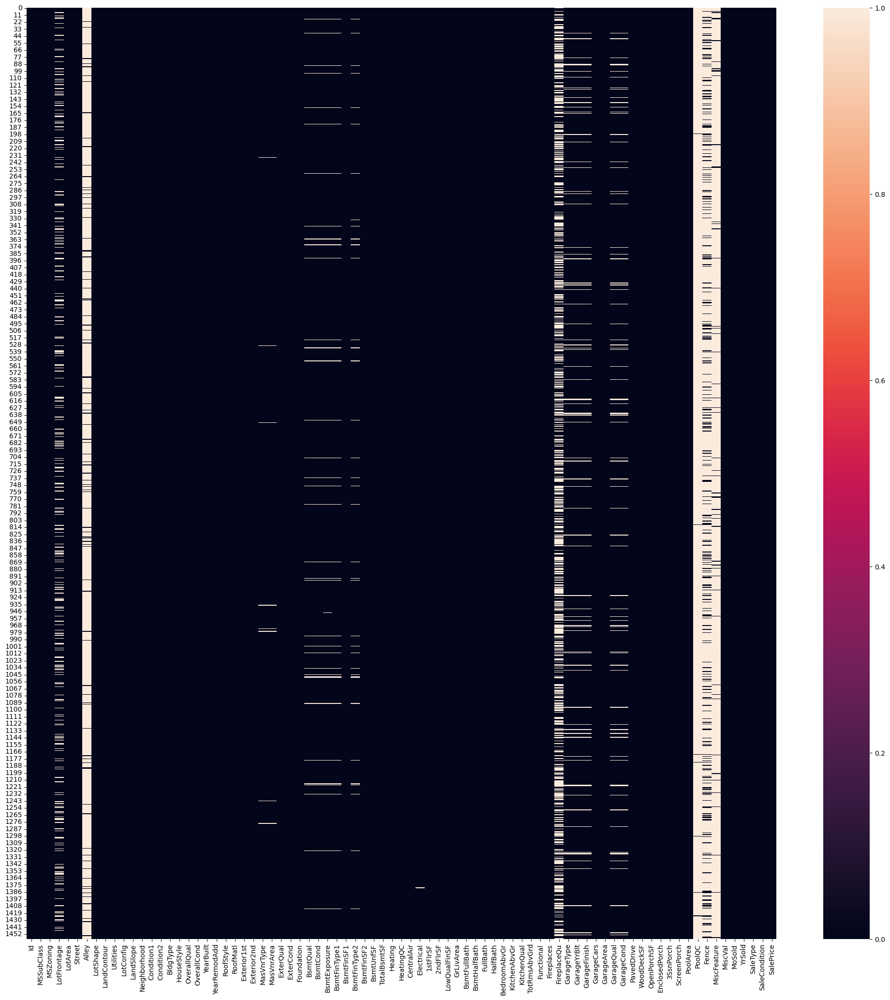

In [17]:
#Checking NaN values through 'Heatmap'
plt.figure(figsize=(25,25))
sns.heatmap(df.isnull())

In [21]:
df.isnull().sum()

Id                  0
MSSubClass          0
MSZoning            0
LotFrontage       259
LotArea             0
Street              0
Alley            1369
LotShape            0
LandContour         0
Utilities           0
LotConfig           0
LandSlope           0
Neighborhood        0
Condition1          0
Condition2          0
BldgType            0
HouseStyle          0
OverallQual         0
OverallCond         0
YearBuilt           0
YearRemodAdd        0
RoofStyle           0
RoofMatl            0
Exterior1st         0
Exterior2nd         0
MasVnrType          8
MasVnrArea          8
ExterQual           0
ExterCond           0
Foundation          0
BsmtQual           37
BsmtCond           37
BsmtExposure       38
BsmtFinType1       37
BsmtFinSF1          0
BsmtFinType2       38
BsmtFinSF2          0
BsmtUnfSF           0
TotalBsmtSF         0
Heating             0
HeatingQC           0
CentralAir          0
Electrical          1
1stFlrSF            0
2ndFlrSF            0
LowQualFin

In [ ]:
df['Alley'].isnull().sum()

# Data Cleaning :

In [23]:
df.shape

(1460, 81)

In [8]:
# To treat Nan we will remove some columns.
#here we are checking NaN percentage in each column :
# formula: (value / total value) * 100
null_var=(df.isnull().sum()/df.shape[0])*100
null_var

Id                0.000000
MSSubClass        0.000000
MSZoning          0.000000
LotFrontage      17.739726
LotArea           0.000000
Street            0.000000
Alley            93.767123
LotShape          0.000000
LandContour       0.000000
Utilities         0.000000
LotConfig         0.000000
LandSlope         0.000000
Neighborhood      0.000000
Condition1        0.000000
Condition2        0.000000
BldgType          0.000000
HouseStyle        0.000000
OverallQual       0.000000
OverallCond       0.000000
YearBuilt         0.000000
YearRemodAdd      0.000000
RoofStyle         0.000000
RoofMatl          0.000000
Exterior1st       0.000000
Exterior2nd       0.000000
MasVnrType        0.547945
MasVnrArea        0.547945
ExterQual         0.000000
ExterCond         0.000000
Foundation        0.000000
BsmtQual          2.534247
BsmtCond          2.534247
BsmtExposure      2.602740
BsmtFinType1      2.534247
BsmtFinSF1        0.000000
BsmtFinType2      2.602740
BsmtFinSF2        0.000000
B

In [79]:
# Here we are selecting those columns which having NaN values more then 17%
null_var[null_var>17]

LotFrontage    17.739726
Alley          93.767123
FireplaceQu    47.260274
PoolQC         99.520548
Fence          80.753425
MiscFeature    96.301370
dtype: float64

In [9]:
null_var.size

81

In [10]:
# Selecting the keys :
df_del_col=null_var[null_var>17].keys()
df_del_col

Index(['LotFrontage', 'Alley', 'FireplaceQu', 'PoolQC', 'Fence',
       'MiscFeature'],
      dtype='object')

In [438]:
# Finally now we are removing the columns having more then 17% Nan Values
df2=df.drop(columns=df_del_col) 


In [439]:
df2.shape

(1460, 75)

In [14]:
df2.columns

Index(['Id', 'MSSubClass', 'MSZoning', 'LotArea', 'Street', 'LotShape',
       'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood',
       'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'OverallQual',
       'OverallCond', 'YearBuilt', 'YearRemodAdd', 'RoofStyle', 'RoofMatl',
       'Exterior1st', 'Exterior2nd', 'MasVnrType', 'MasVnrArea', 'ExterQual',
       'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure',
       'BsmtFinType1', 'BsmtFinSF1', 'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF',
       'TotalBsmtSF', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical',
       '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath',
       'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr',
       'KitchenQual', 'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDrive', 'WoodDeckSF', 'OpenPorchSF',
       'Enclos

In [440]:
# Removing Id column which is not required
df2=df2.drop(columns=['Id'])


In [31]:
df2.columns

Index(['MSSubClass', 'MSZoning', 'LotArea', 'Street', 'LotShape',
       'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood',
       'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'OverallQual',
       'OverallCond', 'YearBuilt', 'YearRemodAdd', 'RoofStyle', 'RoofMatl',
       'Exterior1st', 'Exterior2nd', 'MasVnrType', 'MasVnrArea', 'ExterQual',
       'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure',
       'BsmtFinType1', 'BsmtFinSF1', 'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF',
       'TotalBsmtSF', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical',
       '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath',
       'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr',
       'KitchenQual', 'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDrive', 'WoodDeckSF', 'OpenPorchSF',
       'EnclosedPorc

In [32]:
df2.isnull().sum()

MSSubClass        0
MSZoning          0
LotArea           0
Street            0
LotShape          0
LandContour       0
Utilities         0
LotConfig         0
LandSlope         0
Neighborhood      0
Condition1        0
Condition2        0
BldgType          0
HouseStyle        0
OverallQual       0
OverallCond       0
YearBuilt         0
YearRemodAdd      0
RoofStyle         0
RoofMatl          0
Exterior1st       0
Exterior2nd       0
MasVnrType        8
MasVnrArea        8
ExterQual         0
ExterCond         0
Foundation        0
BsmtQual         37
BsmtCond         37
BsmtExposure     38
BsmtFinType1     37
BsmtFinSF1        0
BsmtFinType2     38
BsmtFinSF2        0
BsmtUnfSF         0
TotalBsmtSF       0
Heating           0
HeatingQC         0
CentralAir        0
Electrical        1
1stFlrSF          0
2ndFlrSF          0
LowQualFinSF      0
GrLivArea         0
BsmtFullBath      0
BsmtHalfBath      0
FullBath          0
HalfBath          0
BedroomAbvGr      0
KitchenAbvGr      0


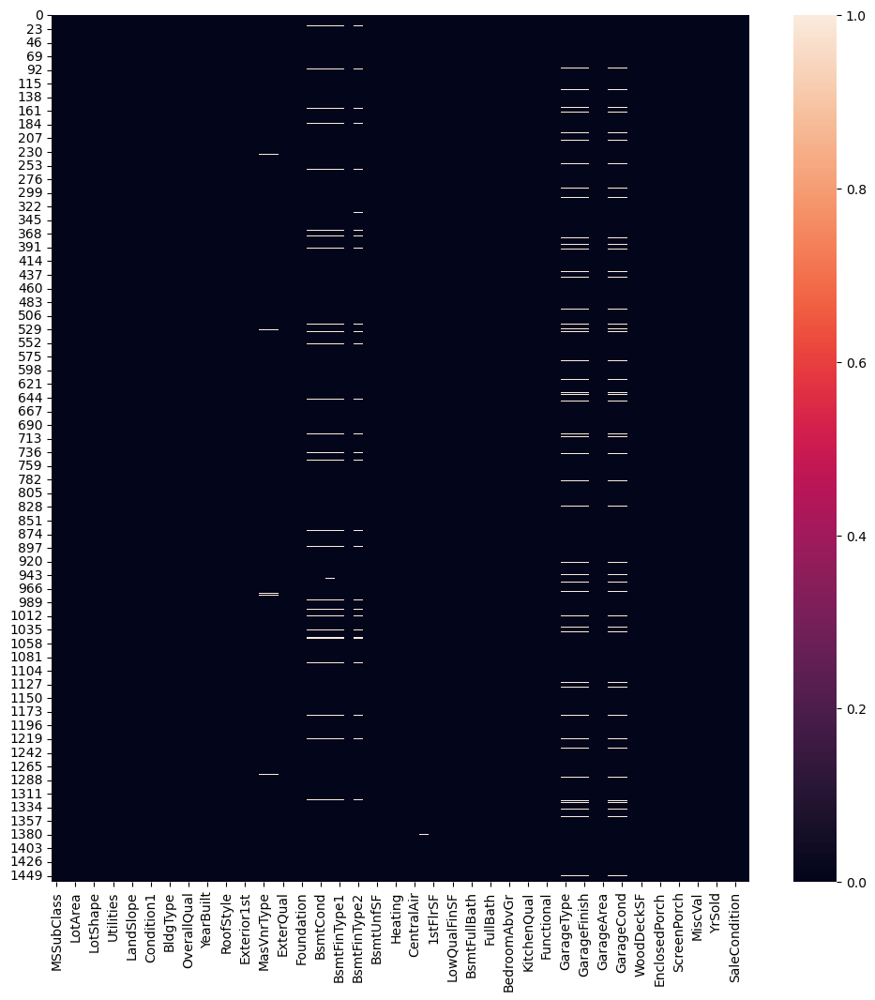

In [26]:
# After removing columns having muximum NaNs again we will check with heatmap
plt.figure(figsize=(12,12))
sns.heatmap(df2.isnull())
plt.show()

In [441]:
#1st we use drop method to clean our data
# in this method we will drop all the rows having NaN values 
df_del_clean=df2.dropna()


In [442]:
df_del_clean.isnull().sum().sum()

0

In [443]:
df_del_clean.shape

(1338, 74)

In [445]:
# NaN available in Oreginal Data Frame 
df.isnull().sum().sum()

6965

In [446]:
# NaN available in Data Frame after droping the columns
df2.isnull().sum().sum()

609

In [36]:
# NaN available in Data Frame after droping the rows
df_del_clean.isnull().sum().sum()

0

In [447]:
# This was the easiest way to treat NaN values.
# We can treat them by replacing Null values with most probable value
#by various methods.
# Befor Null value treatment first we will check for outliers in the DataFrame.

# Outliers Detection

In [474]:
# There are many ways to detect outliers from data
# First we use Percentile method
# For outlier check we calculate the max and min threshold of columns
# Here we check for only one column MSSubClass
max_th=df2['MSSubClass'].quantile(0.999)
min_th=df2['MSSubClass'].quantile(0.001)
print(max_th,min_th)

190.0 20.0


In [25]:
# Test the column with max and min threshold for outliers
# Here we can see that there is no outlier available in column 'MSSubClass'
df2[(df2['MSSubClass']> max_th) | (df2['MSSubClass']< min_th)]

,Id,MSSubClass,MSZoning,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice


In [94]:
df2[(df2['MSSubClass']> max_th) | (df2['MSSubClass']< min_th)].shape

(0, 75)

In [37]:
# Now we are calculating the max and min threshold in whole DataFrame
max_th_all=df2.quantile(0.999)
min_th_all=df2.quantile(0.001)


In [38]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 74 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   MSSubClass     1460 non-null   int64  
 1   MSZoning       1460 non-null   object 
 2   LotArea        1460 non-null   int64  
 3   Street         1460 non-null   object 
 4   LotShape       1460 non-null   object 
 5   LandContour    1460 non-null   object 
 6   Utilities      1460 non-null   object 
 7   LotConfig      1460 non-null   object 
 8   LandSlope      1460 non-null   object 
 9   Neighborhood   1460 non-null   object 
 10  Condition1     1460 non-null   object 
 11  Condition2     1460 non-null   object 
 12  BldgType       1460 non-null   object 
 13  HouseStyle     1460 non-null   object 
 14  OverallQual    1460 non-null   int64  
 15  OverallCond    1460 non-null   int64  
 16  YearBuilt      1460 non-null   int64  
 17  YearRemodAdd   1460 non-null   int64  
 18  RoofStyl

In [39]:
#To check outliers we will select the numerical columns:-
df2_num=df2.select_dtypes(include=['int64','float64'])
df2_num.head()

,MSSubClass,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
0,60,8450,7,5,2003,2003,196.0,706,0,150,856,856,854,0,1710,1,0,2,1,3,1,8,0,2003.0,2,548,0,61,0,0,0,0,0,2,2008,208500
1,20,9600,6,8,1976,1976,0.0,978,0,284,1262,1262,0,0,1262,0,1,2,0,3,1,6,1,1976.0,2,460,298,0,0,0,0,0,0,5,2007,181500
2,60,11250,7,5,2001,2002,162.0,486,0,434,920,920,866,0,1786,1,0,2,1,3,1,6,1,2001.0,2,608,0,42,0,0,0,0,0,9,2008,223500
3,70,9550,7,5,1915,1970,0.0,216,0,540,756,961,756,0,1717,1,0,1,0,3,1,7,1,1998.0,3,642,0,35,272,0,0,0,0,2,2006,140000
4,60,14260,8,5,2000,2000,350.0,655,0,490,1145,1145,1053,0,2198,1,0,2,1,4,1,9,1,2000.0,3,836,192,84,0,0,0,0,0,12,2008,250000


In [41]:
#Total of 36 columns having numerical data
df2_num.shape

(1460, 36)

In [40]:
#Name of Num columns
df2_num.columns

Index(['MSSubClass', 'LotArea', 'OverallQual', 'OverallCond', 'YearBuilt',
       'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF',
       'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea',
       'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr',
       'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageYrBlt',
       'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF',
       'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal',
       'MoSold', 'YrSold', 'SalePrice'],
      dtype='object')

In [475]:
# Minimum Threshold 
min_th_all

MSSubClass          20.000
LotArea           1483.426
OverallQual          1.459
OverallCond          2.000
YearBuilt         1877.295
YearRemodAdd      1950.000
MasVnrArea           0.000
BsmtFinSF1           0.000
BsmtFinSF2           0.000
BsmtUnfSF            0.000
TotalBsmtSF          0.000
1stFlrSF           402.294
2ndFlrSF             0.000
LowQualFinSF         0.000
GrLivArea          457.278
BsmtFullBath         0.000
BsmtHalfBath         0.000
FullBath             0.000
HalfBath             0.000
BedroomAbvGr         0.000
KitchenAbvGr         1.000
TotRmsAbvGrd         3.000
Fireplaces           0.000
GarageYrBlt       1906.756
GarageCars           0.000
GarageArea           0.000
WoodDeckSF           0.000
OpenPorchSF          0.000
EnclosedPorch        0.000
3SsnPorch            0.000
ScreenPorch          0.000
PoolArea             0.000
MiscVal              0.000
MoSold               1.000
YrSold            2006.000
SalePrice        36499.351
Name: 0.001, dtype: float64

In [476]:
#Maximum Threshold
max_th_all

MSSubClass          190.000
LotArea          162062.060
OverallQual          10.000
OverallCond           9.000
YearBuilt          2009.000
YearRemodAdd       2010.000
MasVnrArea         1284.192
BsmtFinSF1         2226.952
BsmtFinSF2         1123.787
BsmtUnfSF          2138.312
TotalBsmtSF        3203.246
1stFlrSF           3186.690
2ndFlrSF           1847.214
LowQualFinSF        522.033
GrLivArea          4584.200
BsmtFullBath          2.000
BsmtHalfBath          1.541
FullBath              3.000
HalfBath              2.000
BedroomAbvGr          6.000
KitchenAbvGr          2.541
TotRmsAbvGrd         12.000
Fireplaces            3.000
GarageYrBlt        2010.000
GarageCars            4.000
GarageArea         1374.394
WoodDeckSF          732.328
OpenPorchSF         513.361
EnclosedPorch       360.296
3SsnPorch           367.067
ScreenPorch         426.230
PoolArea            614.952
MiscVal            6096.800
MoSold               12.000
YrSold             2010.000
SalePrice        689

In [43]:
max_th_all['MSSubClass']

190.0

In [46]:
#Now We will check outliers from whole 'df2' dataframe 
df2.shape

(1460, 74)

In [412]:
#Creating Empty Dataframe for outliers
df2_outlier=pd.DataFrame([])

In [413]:
df2_outlier

""


In [414]:
#calculating outliers in complete DataFrame 'df2'
for item in df2_num.columns:
    i=(df2[df2[item]>df2[item].quantile(0.999)])
    j=(df2[df2[item]<df2[item].quantile(0.001)])
    df2_outlier=pd.concat([df2_outlier,i],axis=0)
    df2_outlier=pd.concat([df2_outlier,j],axis=0)
    

In [415]:
# Percentile method
# Here we can see that there are total 63 rows having outliers 
df2_outlier.shape

(63, 74)

In [416]:
#Here it is possiblities of data duplication
# Hence we will check for duplicate data
df2_outlier.duplicated().sum()

15

In [417]:
#we found 15 duplicated rows
# now we remove all duplicated data
df2_outlier=df2_outlier.drop_duplicates()
df2_outlier.shape

(48, 74)

In [58]:
df2_outlier

,MSSubClass,MSZoning,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
313,20,RL,215245,Pave,IR3,Low,AllPub,Inside,Sev,Timber,Norm,Norm,1Fam,1Story,7,5,1965,1965,Hip,CompShg,BrkFace,BrkFace,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,1236,Rec,820,80,2136,GasW,TA,Y,SBrkr,2036,0,0,2036,2,0,2,0,3,1,TA,8,Typ,2,Attchd,1965.0,RFn,2,513,TA,TA,Y,0,0,0,0,0,0,0,6,2009,WD,Normal,375000
335,190,RL,164660,Grvl,IR1,HLS,AllPub,Corner,Sev,Timber,Norm,Norm,2fmCon,1.5Fin,5,6,1965,1965,Gable,CompShg,Plywood,Plywood,None,0.0,TA,TA,CBlock,TA,TA,Gd,ALQ,1249,BLQ,147,103,1499,GasA,Ex,Y,SBrkr,1619,167,0,1786,2,0,2,0,3,1,TA,7,Typ,2,Attchd,1965.0,Fin,2,529,TA,TA,Y,670,0,0,0,0,0,700,8,2008,WD,Normal,228950
956,160,RM,1300,Pave,Reg,Lvl,AllPub,Inside,Gtl,Blueste,Norm,Norm,TwnhsE,2Story,6,6,1980,1980,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,No,ALQ,285,Unf,0,276,561,GasA,TA,Y,SBrkr,561,668,0,1229,0,0,1,1,2,1,TA,5,Typ,1,Attchd,1980.0,Fin,2,462,TA,TA,Y,150,0,0,0,0,0,0,5,2009,WD,Normal,124000
1039,180,RM,1477,Pave,Reg,Lvl,AllPub,Inside,Gtl,MeadowV,Norm,Norm,TwnhsE,SFoyer,4,4,1970,1970,Gable,CompShg,CemntBd,CmentBd,None,0.0,TA,TA,CBlock,Gd,TA,Av,GLQ,509,Unf,0,121,630,GasA,TA,Y,SBrkr,630,0,0,630,1,0,1,0,1,1,TA,3,Typ,0,Attchd,1970.0,Unf,1,286,TA,TA,Y,0,0,0,0,0,0,0,4,2009,WD,Normal,80000
375,30,RL,10020,Pave,IR1,Low,AllPub,Inside,Sev,Edwards,Norm,Norm,1Fam,1Story,1,1,1922,1950,Gable,CompShg,Wd Sdng,Wd Sdng,None,0.0,Fa,Fa,BrkTil,Fa,Po,Gd,BLQ,350,Unf,0,333,683,GasA,Gd,N,FuseA,904,0,0,904,1,0,0,1,1,1,Fa,4,Maj1,0,NaN,NaN,NaN,0,0,NaN,NaN,Y,0,0,0,0,0,0,0,3,2009,WD,Normal,61000
533,20,RL,5000,Pave,Reg,Low,AllPub,Inside,Mod,BrkSide,Norm,Norm,1Fam,1Story,1,3,1946,1950,Gable,CompShg,VinylSd,VinylSd,None,0.0,Fa,Fa,Slab,NaN,NaN,NaN,NaN,0,NaN,0,0,0,GasA,Fa,N,FuseF,334,0,0,334,0,0,1,0,1,1,Fa,2,Typ,0,NaN,NaN,NaN,0,0,NaN,NaN,N,0,0,0,0,0,0,0,1,2007,WD,Normal,39300
378,20,RL,11394,Pave,Reg,Lvl,AllPub,Corner,Gtl,StoneBr,Norm,Norm,1Fam,1Story,9,2,2010,2010,Hip,CompShg,VinylSd,VinylSd,Stone,350.0,Gd,TA,PConc,Ex,TA,Av,GLQ,1445,Unf,0,411,1856,GasA,Ex,Y,SBrkr,1856,0,0,1856,1,0,1,1,1,1,Ex,8,Typ,1,Attchd,2010.0,Fin,3,834,TA,TA,Y,113,0,0,0,0,0,0,6,2010,New,Partial,394432
1137,50,RL,6342,Pave,Reg,Lvl,AllPub,Inside,Gtl,Sawyer,Feedr,Norm,1Fam,1.5Fin,5,8,1875,1996,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,Gd,CBlock,TA,TA,No,Unf,0,Unf,0,780,780,GasA,Gd,N,SBrkr,780,240,0,1020,0,0,1,0,2,1,TA,6,Typ,0,NaN,NaN,NaN,0,0,NaN,NaN,N,0,0,176,0,0,0,0,5,2010,WD,Normal,94000
1349,70,RM,5250,Pave,Reg,Lvl,AllPub,Inside,Gtl,OldTown,Norm,Norm,1Fam,2Story,8,5,1872,1987,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,Gd,BrkTil,TA,Fa,No,LwQ,259,Unf,0,425,684,OthW,Fa,N,SBrkr,938,1215,205,2358,0,0,2,0,4,1,TA,8,Typ,0,NaN,NaN,NaN,0,0,NaN,NaN,Y,0,54,20,0,0,0,0,12,2008,WD,Normal,122000
297,60,FV,7399,Pave,IR1,Lvl,AllPub,Inside,Gtl,Somerst,Norm,Norm,1Fam,2Story,7,5,1997,1998,Hip,CompShg,VinylSd,VinylSd,BrkFace,1600.0,Gd,TA,PConc,Gd,TA,No,BLQ,649,Unf,0,326,975,GasA,Ex,Y,SBrkr,975,975,0,1950,0,0,2,1,3,1,Gd,7,Typ,1,Detchd,1997.0,RFn,2,576,TA,TA,Y,0,10,0,0,198,0,0,6,2007,WD,Normal,239000


In [60]:
# Droping the outliers from our dataframe.
row_outlier=df2_outlier.index
row_outlier

Int64Index([ 313,  335,  956, 1039,  375,  533,  378, 1137, 1349,  297, 1169,
             523, 1298,  322,  542,  224,  477,  332,  496,  705,  691, 1182,
             170,  185, 1100,  738,  597,  954,  635,   48,  809,   93,  653,
             581,   53, 1459,  495, 1328,  197,  747,   55,  205, 1386,  810,
            1423,  346, 1230,  916],
           dtype='int64')

In [452]:
# After identifying the outliers now we can remove them from our data set
df3=df2.drop(row_outlier)

In [453]:
df2.shape

(1460, 74)

In [454]:
# df3 is a DataFrame that is Outlier free 
df3.shape

(1412, 74)

In [ ]:
#We will again check outliers with z_score method

In [455]:
df3_z=pd.DataFrame()
df3_z=pd.concat([df3_z,df2],axis=0)

In [456]:
df3_z.shape

(1460, 74)

In [457]:
df2_num.head()

,MSSubClass,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
0,60,8450,7,5,2003,2003,196.0,706,0,150,856,856,854,0,1710,1,0,2,1,3,1,8,0,2003.0,2,548,0,61,0,0,0,0,0,2,2008,208500
1,20,9600,6,8,1976,1976,0.0,978,0,284,1262,1262,0,0,1262,0,1,2,0,3,1,6,1,1976.0,2,460,298,0,0,0,0,0,0,5,2007,181500
2,60,11250,7,5,2001,2002,162.0,486,0,434,920,920,866,0,1786,1,0,2,1,3,1,6,1,2001.0,2,608,0,42,0,0,0,0,0,9,2008,223500
3,70,9550,7,5,1915,1970,0.0,216,0,540,756,961,756,0,1717,1,0,1,0,3,1,7,1,1998.0,3,642,0,35,272,0,0,0,0,2,2006,140000
4,60,14260,8,5,2000,2000,350.0,655,0,490,1145,1145,1053,0,2198,1,0,2,1,4,1,9,1,2000.0,3,836,192,84,0,0,0,0,0,12,2008,250000


In [458]:
# to calculate z_score in each column we apply a for loop 
for col in df2_num.columns:
  i='z_score_{}'.format(col)
  df3_z[i]=(df2_num[col]-df2_num[col].mean())/df2_num[col].std()


In [459]:
df3_z.shape

(1460, 110)

In [466]:
df3_z_cols=df3_z.columns
print(df3_z_cols[74],df3_z_cols[109],sep=" , ")

z_score_MSSubClass , z_score_SalePrice


In [467]:
#now we will identify the outliers from dataframe
#for that we create a empty data frame 
z_score_outliers=pd.DataFrame()

In [468]:
for i in range(74,110):
  col=df3_z_cols[i]
  z_score_outliers=pd.concat([z_score_outliers,df3_z[(df3_z[col]>=3) 
                                                   | (df3_z[col]<=-3)]],axis=0)

In [469]:
z_score_outliers.shape

(672, 110)

In [478]:
z_score_outliers.duplicated().sum()

236

In [480]:
z_score_outliers=z_score_outliers.drop_duplicates()
z_score_outliers.shape


(436, 110)

note :we can see that there are 436 rows available with outliers, because of our data is limited so we will go with percentile method.

In [64]:
df3.head()

,MSSubClass,MSZoning,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,60,RL,8450,Pave,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,0,2,2008,WD,Normal,208500
1,20,RL,9600,Pave,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,0,5,2007,WD,Normal,181500
2,60,RL,11250,Pave,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,0,9,2008,WD,Normal,223500
3,70,RL,9550,Pave,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,0,2,2006,WD,Abnorml,140000
4,60,RL,14260,Pave,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,0,12,2008,WD,Normal,250000


In [61]:
# Now we will treat the NaN values from the DataFrame which is Outlier free. 
df3.isnull().sum().sum()

548

In [62]:
df3.tail()

,MSSubClass,MSZoning,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
1454,20,FV,7500,Pave,Reg,Lvl,AllPub,Inside,Gtl,Somerst,Norm,Norm,1Fam,1Story,7,5,2004,2005,Gable,CompShg,VinylSd,VinylSd,None,0.0,Gd,TA,PConc,Gd,TA,No,GLQ,410,Unf,0,811,1221,GasA,Ex,Y,SBrkr,1221,0,0,1221,1,0,2,0,2,1,Gd,6,Typ,0,Attchd,2004.0,RFn,2,400,TA,TA,Y,0,113,0,0,0,0,0,10,2009,WD,Normal,185000
1455,60,RL,7917,Pave,Reg,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,5,1999,2000,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,PConc,Gd,TA,No,Unf,0,Unf,0,953,953,GasA,Ex,Y,SBrkr,953,694,0,1647,0,0,2,1,3,1,TA,7,Typ,1,Attchd,1999.0,RFn,2,460,TA,TA,Y,0,40,0,0,0,0,0,8,2007,WD,Normal,175000
1456,20,RL,13175,Pave,Reg,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,1978,1988,Gable,CompShg,Plywood,Plywood,Stone,119.0,TA,TA,CBlock,Gd,TA,No,ALQ,790,Rec,163,589,1542,GasA,TA,Y,SBrkr,2073,0,0,2073,1,0,2,0,3,1,TA,7,Min1,2,Attchd,1978.0,Unf,2,500,TA,TA,Y,349,0,0,0,0,0,0,2,2010,WD,Normal,210000
1457,70,RL,9042,Pave,Reg,Lvl,AllPub,Inside,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,9,1941,2006,Gable,CompShg,CemntBd,CmentBd,None,0.0,Ex,Gd,Stone,TA,Gd,No,GLQ,275,Unf,0,877,1152,GasA,Ex,Y,SBrkr,1188,1152,0,2340,0,0,2,0,4,1,Gd,9,Typ,2,Attchd,1941.0,RFn,1,252,TA,TA,Y,0,60,0,0,0,0,2500,5,2010,WD,Normal,266500
1458,20,RL,9717,Pave,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,5,6,1950,1996,Hip,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,TA,TA,Mn,GLQ,49,Rec,1029,0,1078,GasA,Gd,Y,FuseA,1078,0,0,1078,1,0,1,0,2,1,Gd,5,Typ,0,Attchd,1950.0,Unf,1,240,TA,TA,Y,366,0,112,0,0,0,0,4,2010,WD,Normal,142125


In [65]:
df3.isnull().shape

(1412, 74)

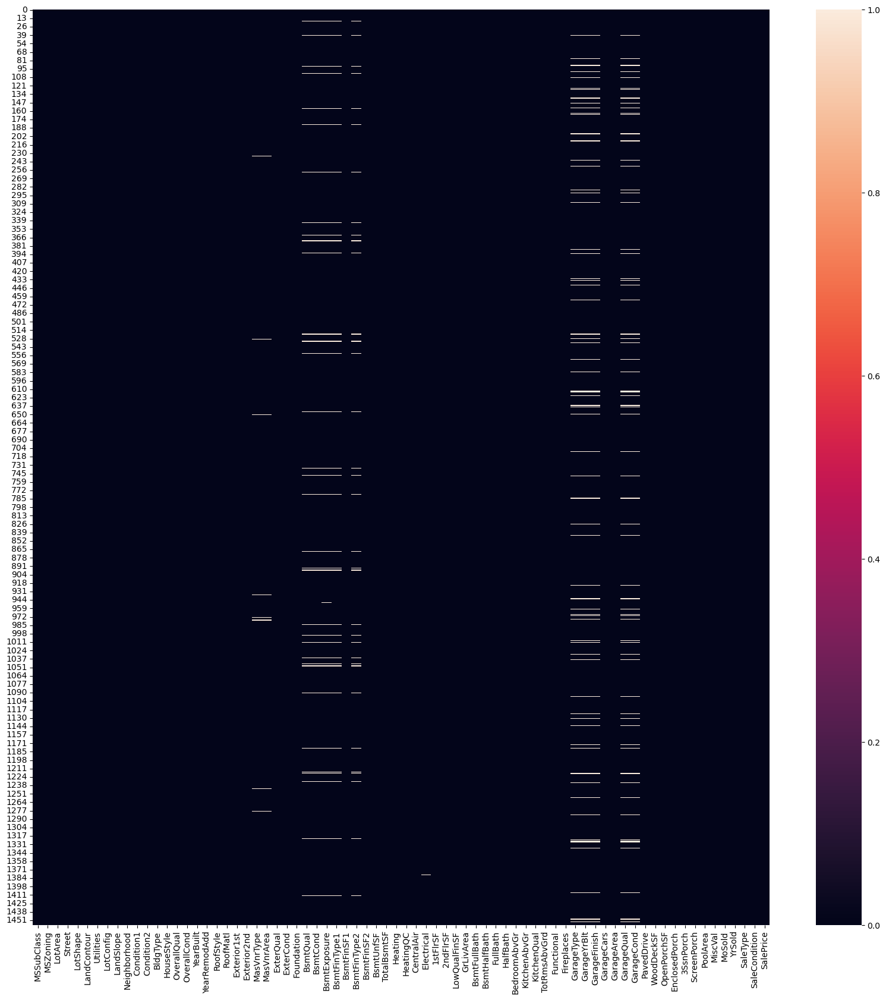

In [64]:
#We will check through heatmap
plt.figure(figsize=(20,20))
sns.heatmap(df3.isnull())
plt.show()

In [66]:
#now we will treat remaining NaN values
num_col=max_th_all.keys()

In [67]:
df3.isnull().sum()

MSSubClass        0
MSZoning          0
LotArea           0
Street            0
LotShape          0
LandContour       0
Utilities         0
LotConfig         0
LandSlope         0
Neighborhood      0
Condition1        0
Condition2        0
BldgType          0
HouseStyle        0
OverallQual       0
OverallCond       0
YearBuilt         0
YearRemodAdd      0
RoofStyle         0
RoofMatl          0
Exterior1st       0
Exterior2nd       0
MasVnrType        8
MasVnrArea        8
ExterQual         0
ExterCond         0
Foundation        0
BsmtQual         35
BsmtCond         35
BsmtExposure     36
BsmtFinType1     35
BsmtFinSF1        0
BsmtFinType2     35
BsmtFinSF2        0
BsmtUnfSF         0
TotalBsmtSF       0
Heating           0
HeatingQC         0
CentralAir        0
Electrical        1
1stFlrSF          0
2ndFlrSF          0
LowQualFinSF      0
GrLivArea         0
BsmtFullBath      0
BsmtHalfBath      0
FullBath          0
HalfBath          0
BedroomAbvGr      0
KitchenAbvGr      0


In [77]:
null_per=(df3.isnull().sum()/df3.shape[0])*100

In [70]:
null_per

MSSubClass       0.000000
MSZoning         0.000000
LotArea          0.000000
Street           0.000000
LotShape         0.000000
LandContour      0.000000
Utilities        0.000000
LotConfig        0.000000
LandSlope        0.000000
Neighborhood     0.000000
Condition1       0.000000
Condition2       0.000000
BldgType         0.000000
HouseStyle       0.000000
OverallQual      0.000000
OverallCond      0.000000
YearBuilt        0.000000
YearRemodAdd     0.000000
RoofStyle        0.000000
RoofMatl         0.000000
Exterior1st      0.000000
Exterior2nd      0.000000
MasVnrType       0.566572
MasVnrArea       0.566572
ExterQual        0.000000
ExterCond        0.000000
Foundation       0.000000
BsmtQual         2.478754
BsmtCond         2.478754
BsmtExposure     2.549575
BsmtFinType1     2.478754
BsmtFinSF1       0.000000
BsmtFinType2     2.478754
BsmtFinSF2       0.000000
BsmtUnfSF        0.000000
TotalBsmtSF      0.000000
Heating          0.000000
HeatingQC        0.000000
CentralAir  

In [78]:
#selecting columns having NaNs
null_col=null_per[null_per!=0]

In [79]:
null_col

MasVnrType      0.566572
MasVnrArea      0.566572
BsmtQual        2.478754
BsmtCond        2.478754
BsmtExposure    2.549575
BsmtFinType1    2.478754
BsmtFinType2    2.478754
Electrical      0.070822
GarageType      5.028329
GarageYrBlt     5.028329
GarageFinish    5.028329
GarageQual      5.028329
GarageCond      5.028329
dtype: float64

In [74]:
null_per[null_per!=0].info()
    

<class 'pandas.core.series.Series'>
Index: 13 entries, MasVnrType to GarageCond
Series name: None
Non-Null Count  Dtype  
--------------  -----  
13 non-null     float64
dtypes: float64(1)
memory usage: 208.0+ bytes


In [80]:
null_col_keys=null_col.keys()
null_col_keys

Index(['MasVnrType', 'MasVnrArea', 'BsmtQual', 'BsmtCond', 'BsmtExposure',
       'BsmtFinType1', 'BsmtFinType2', 'Electrical', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageQual', 'GarageCond'],
      dtype='object')

In [81]:
df3[null_col_keys].info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1412 entries, 0 to 1458
Data columns (total 13 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   MasVnrType    1404 non-null   object 
 1   MasVnrArea    1404 non-null   float64
 2   BsmtQual      1377 non-null   object 
 3   BsmtCond      1377 non-null   object 
 4   BsmtExposure  1376 non-null   object 
 5   BsmtFinType1  1377 non-null   object 
 6   BsmtFinType2  1377 non-null   object 
 7   Electrical    1411 non-null   object 
 8   GarageType    1341 non-null   object 
 9   GarageYrBlt   1341 non-null   float64
 10  GarageFinish  1341 non-null   object 
 11  GarageQual    1341 non-null   object 
 12  GarageCond    1341 non-null   object 
dtypes: float64(2), object(11)
memory usage: 154.4+ KB


In [82]:
# Hear we can observe the data distribution in df3
df3[null_col_keys].head()

,MasVnrType,MasVnrArea,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,Electrical,GarageType,GarageYrBlt,GarageFinish,GarageQual,GarageCond
0,BrkFace,196.0,Gd,TA,No,GLQ,Unf,SBrkr,Attchd,2003.0,RFn,TA,TA
1,None,0.0,Gd,TA,Gd,ALQ,Unf,SBrkr,Attchd,1976.0,RFn,TA,TA
2,BrkFace,162.0,Gd,TA,Mn,GLQ,Unf,SBrkr,Attchd,2001.0,RFn,TA,TA
3,None,0.0,TA,Gd,No,ALQ,Unf,SBrkr,Detchd,1998.0,Unf,TA,TA
4,BrkFace,350.0,Gd,TA,Av,GLQ,Unf,SBrkr,Attchd,2000.0,RFn,TA,TA


In [83]:
#we can observe that column 'MasVnrArea' is dependant on 'MasVnrType'
# so if there is no 'MasVnrType' available then 'MasVnrArea' should be 0
#For that reason, to treat NaNs in this column we will convert 'MasVnrArea' into
#'str'
df3['MasVnrArea']=df3['MasVnrArea'].astype(str)
df3['MasVnrArea'].info()

<class 'pandas.core.series.Series'>
Int64Index: 1412 entries, 0 to 1458
Series name: MasVnrArea
Non-Null Count  Dtype 
--------------  ----- 
1412 non-null   object
dtypes: object(1)
memory usage: 22.1+ KB


In [482]:
# we will fill 'MasVnrArea' with mode
df3['MasVnrArea']=df3['MasVnrArea'].fillna(df3['MasVnrArea'].mode())

In [481]:
df3['MasVnrArea'].mode()

0    0.0
Name: MasVnrArea, dtype: float64

In [86]:
df3['MasVnrArea'].isnull().sum()

0

In [87]:
df3['MasVnrArea']

0        196.0
1          0.0
2        162.0
3          0.0
4        350.0
5          0.0
6        186.0
7        240.0
8          0.0
9          0.0
10         0.0
11       286.0
12         0.0
13       306.0
14       212.0
15         0.0
16       180.0
17         0.0
18         0.0
19         0.0
20       380.0
21         0.0
22       281.0
23         0.0
24         0.0
25       640.0
26         0.0
27       200.0
28         0.0
29         0.0
30         0.0
31         0.0
32         0.0
33         0.0
34       246.0
35       132.0
36         0.0
37       650.0
38         0.0
39         0.0
40       101.0
41         0.0
42         0.0
43         0.0
44         0.0
45       412.0
46         0.0
47         0.0
49         0.0
50         0.0
51         0.0
52         0.0
54         0.0
56       456.0
57         0.0
58      1031.0
59         0.0
60         0.0
61         0.0
62       178.0
63         0.0
64       573.0
65       344.0
66       287.0
67       167.0
68         0.0
69        

In [218]:
# Now we will check another numerical column 'GarageYrBlt'
# this column also having NaNs
# we will check data distribution in it
df3['GarageYrBlt'].value_counts()

2005.0    65
2006.0    57
2004.0    53
2003.0    48
2007.0    48
1977.0    34
1998.0    30
1999.0    30
1976.0    29
2008.0    28
2000.0    27
1968.0    26
2002.0    26
1950.0    23
1962.0    21
1993.0    21
1957.0    20
1966.0    20
1958.0    20
2001.0    20
2009.0    20
1970.0    19
1996.0    19
1954.0    19
1978.0    18
1960.0    18
1965.0    18
1997.0    18
1959.0    17
1995.0    17
1974.0    17
1964.0    17
1994.0    17
1956.0    16
1963.0    16
1990.0    15
1969.0    15
1967.0    15
1979.0    15
1980.0    14
1973.0    14
1940.0    14
1988.0    14
1972.0    14
1955.0    13
1971.0    13
1920.0    13
1961.0    13
1953.0    12
1992.0    12
1948.0    11
1925.0    10
1941.0    10
1985.0    10
1989.0    10
1987.0    10
1981.0     9
1975.0     9
1939.0     9
1991.0     8
1984.0     8
1949.0     8
1983.0     7
1930.0     7
1926.0     6
1986.0     6
1951.0     6
1916.0     5
1922.0     5
1936.0     5
1946.0     4
1928.0     4
1982.0     4
1931.0     4
1945.0     4
1935.0     4
1938.0     3

In [ ]:
#  in above result we can see that the mode of this column is 2005
# now we will check  mean, median mode

In [88]:
df3['GarageYrBlt'].median()

1980.0

In [89]:
df3['GarageYrBlt'].mode()

0    2005.0
Name: GarageYrBlt, dtype: float64

In [90]:
df3['GarageYrBlt'].mean()

1978.6263982102907

In [222]:
df3['GarageYrBlt'].isnull().sum()

71

In [91]:
# filling NaN with Mode
df3['GarageYrBlt']=df3['GarageYrBlt'].fillna(2005)

In [92]:
df3['GarageYrBlt'].isnull().sum()

0

In [93]:
#again we select remaining columns with NaN values
null_percent=(df3.isnull().sum()/df3.shape[0])*100
null_percent

MSSubClass       0.000000
MSZoning         0.000000
LotArea          0.000000
Street           0.000000
LotShape         0.000000
LandContour      0.000000
Utilities        0.000000
LotConfig        0.000000
LandSlope        0.000000
Neighborhood     0.000000
Condition1       0.000000
Condition2       0.000000
BldgType         0.000000
HouseStyle       0.000000
OverallQual      0.000000
OverallCond      0.000000
YearBuilt        0.000000
YearRemodAdd     0.000000
RoofStyle        0.000000
RoofMatl         0.000000
Exterior1st      0.000000
Exterior2nd      0.000000
MasVnrType       0.566572
MasVnrArea       0.000000
ExterQual        0.000000
ExterCond        0.000000
Foundation       0.000000
BsmtQual         2.478754
BsmtCond         2.478754
BsmtExposure     2.549575
BsmtFinType1     2.478754
BsmtFinSF1       0.000000
BsmtFinType2     2.478754
BsmtFinSF2       0.000000
BsmtUnfSF        0.000000
TotalBsmtSF      0.000000
Heating          0.000000
HeatingQC        0.000000
CentralAir  

In [94]:
null_columns=null_percent[null_percent!=0]

In [95]:
null_columns.keys()
# Here we can see that all remaing NaNs are in object columns

Index(['MasVnrType', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1',
       'BsmtFinType2', 'Electrical', 'GarageType', 'GarageFinish',
       'GarageQual', 'GarageCond'],
      dtype='object')

In [96]:
df3[null_columns.keys()].head()

,MasVnrType,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,Electrical,GarageType,GarageFinish,GarageQual,GarageCond
0,BrkFace,Gd,TA,No,GLQ,Unf,SBrkr,Attchd,RFn,TA,TA
1,None,Gd,TA,Gd,ALQ,Unf,SBrkr,Attchd,RFn,TA,TA
2,BrkFace,Gd,TA,Mn,GLQ,Unf,SBrkr,Attchd,RFn,TA,TA
3,None,TA,Gd,No,ALQ,Unf,SBrkr,Detchd,Unf,TA,TA
4,BrkFace,Gd,TA,Av,GLQ,Unf,SBrkr,Attchd,RFn,TA,TA


In [97]:
df3[null_columns.keys()].info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1412 entries, 0 to 1458
Data columns (total 11 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   MasVnrType    1404 non-null   object
 1   BsmtQual      1377 non-null   object
 2   BsmtCond      1377 non-null   object
 3   BsmtExposure  1376 non-null   object
 4   BsmtFinType1  1377 non-null   object
 5   BsmtFinType2  1377 non-null   object
 6   Electrical    1411 non-null   object
 7   GarageType    1341 non-null   object
 8   GarageFinish  1341 non-null   object
 9   GarageQual    1341 non-null   object
 10  GarageCond    1341 non-null   object
dtypes: object(11)
memory usage: 132.4+ KB


In [230]:
df3.isnull().sum().sum()

469

In [98]:
# So we will fill NaNs with Mode value 
#calculating the mode of object columns
Mode=df[null_columns.keys()].mode()
Mode

,MasVnrType,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,Electrical,GarageType,GarageFinish,GarageQual,GarageCond
0,None,TA,TA,No,Unf,Unf,SBrkr,Attchd,Unf,TA,TA


In [99]:
df4=df3
null_columns.keys()

Index(['MasVnrType', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1',
       'BsmtFinType2', 'Electrical', 'GarageType', 'GarageFinish',
       'GarageQual', 'GarageCond'],
      dtype='object')

In [100]:
# creating a function to calculate the mode
def col_mode(var):
    return df4[var].mode()

In [483]:
g=Mode.columns

In [104]:
len(g)

11

In [105]:
#create a for loop and by using function we place the mode value at NaNs
for item in range(len(g)):
    j=g[item]
    k=df4[j].mode()
    df4[j].fillna('{}'.format(k[0]),inplace=True)    
    

In [106]:
#we can check that now there is 0 nan available in our dataframe
df4.isnull().sum().sum()


0

In [107]:
df4.head()

,MSSubClass,MSZoning,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,60,RL,8450,Pave,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,0,2,2008,WD,Normal,208500
1,20,RL,9600,Pave,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,0,5,2007,WD,Normal,181500
2,60,RL,11250,Pave,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,0,9,2008,WD,Normal,223500
3,70,RL,9550,Pave,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,0,2,2006,WD,Abnorml,140000
4,60,RL,14260,Pave,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,0,12,2008,WD,Normal,250000


In [108]:
df4.shape

(1412, 74)

In [111]:
df4.duplicated().sum()

0

In [110]:
# we will check Nans with heatmap

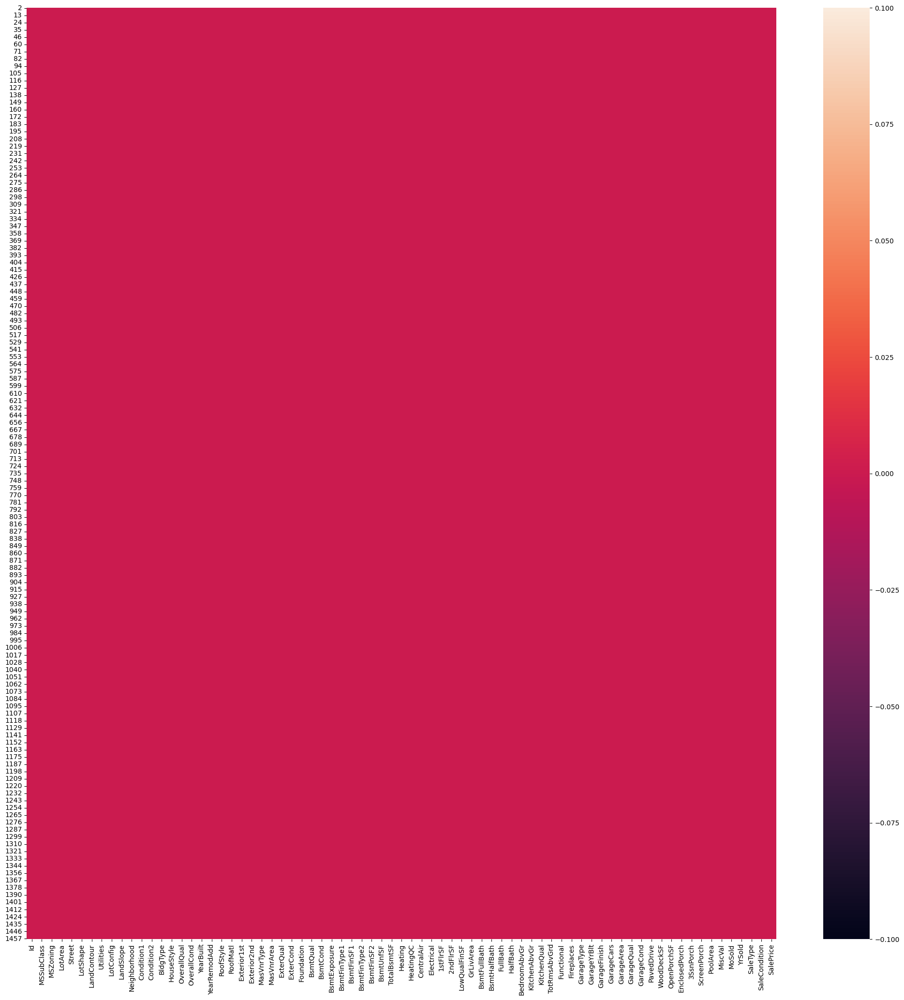

In [166]:
plt.figure(figsize=(25,25))
sns.heatmap(df4.isnull())
plt.show()

In [ ]:
# We applied many methods on oneginal data.
#There are chances to change in oreantation of oreginal dataframe 
#Hence we will check the data orientation 

In [113]:
# Now we have to check whether the data orientation has been changed or not.
#First we check numerical columns
df4_num=df4.select_dtypes(include=['int64','float64'])

In [114]:
df4_num.head()

,MSSubClass,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
0,60,8450,7,5,2003,2003,706,0,150,856,856,854,0,1710,1,0,2,1,3,1,8,0,2003.0,2,548,0,61,0,0,0,0,0,2,2008,208500
1,20,9600,6,8,1976,1976,978,0,284,1262,1262,0,0,1262,0,1,2,0,3,1,6,1,1976.0,2,460,298,0,0,0,0,0,0,5,2007,181500
2,60,11250,7,5,2001,2002,486,0,434,920,920,866,0,1786,1,0,2,1,3,1,6,1,2001.0,2,608,0,42,0,0,0,0,0,9,2008,223500
3,70,9550,7,5,1915,1970,216,0,540,756,961,756,0,1717,1,0,1,0,3,1,7,1,1998.0,3,642,0,35,272,0,0,0,0,2,2006,140000
4,60,14260,8,5,2000,2000,655,0,490,1145,1145,1053,0,2198,1,0,2,1,4,1,9,1,2000.0,3,836,192,84,0,0,0,0,0,12,2008,250000


In [249]:
df4_num.shape


(1412, 35)

In [115]:
df4_num.columns

Index(['MSSubClass', 'LotArea', 'OverallQual', 'OverallCond', 'YearBuilt',
       'YearRemodAdd', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF',
       '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath',
       'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr',
       'TotRmsAbvGrd', 'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea',
       'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch',
       'ScreenPorch', 'PoolArea', 'MiscVal', 'MoSold', 'YrSold', 'SalePrice'],
      dtype='object')

<AxesSubplot:xlabel='MSSubClass', ylabel='Count'>

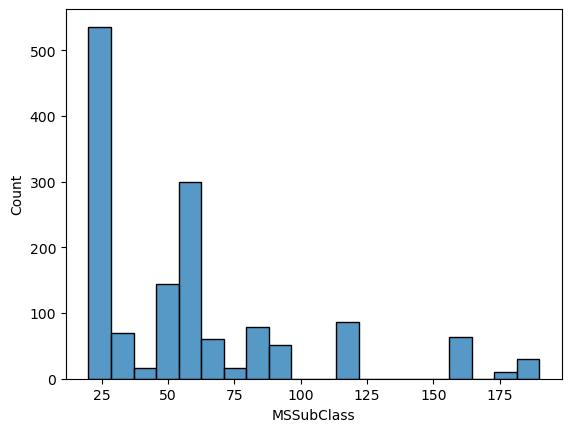

In [117]:
# oreginally data destribution in column 'MSSubClass'
sns.histplot(df['MSSubClass'])


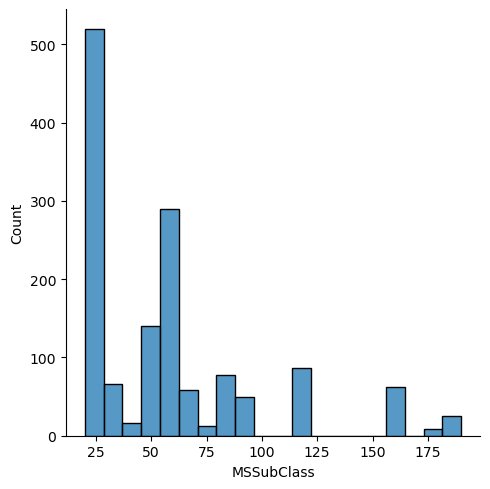

In [172]:
# after cleaning data ddestribution in 'MSSubClass'
sns.displot(df4_num['MSSubClass'])


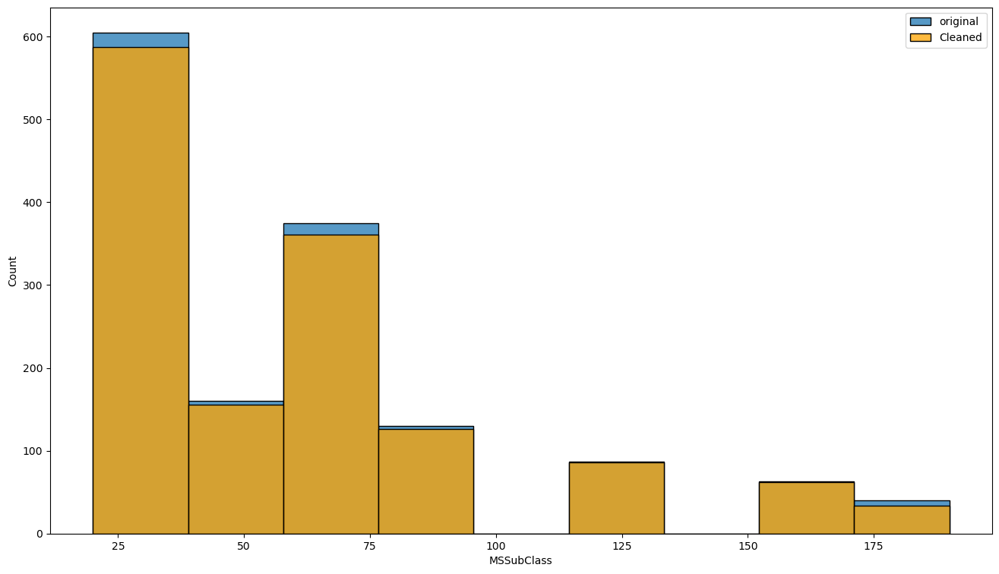

In [118]:
# we will check by overlap histplot on each other 
plt.figure(figsize=(16,9))
sns.histplot(df["MSSubClass"], bins=9, label="original")
sns.histplot(df4_num["MSSubClass"],color="orange", bins=9, label="Cleaned")
plt.legend()


In [ ]:
# here we can see that there data destribution is not changed in this column
# Now we will check for all numerical columns

In [119]:
df4_num_index =df4_num.columns
df4_num_index

Index(['MSSubClass', 'LotArea', 'OverallQual', 'OverallCond', 'YearBuilt',
       'YearRemodAdd', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF',
       '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath',
       'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr',
       'TotRmsAbvGrd', 'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea',
       'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch',
       'ScreenPorch', 'PoolArea', 'MiscVal', 'MoSold', 'YrSold', 'SalePrice'],
      dtype='object')

In [120]:
df4_num_index.shape

(35,)

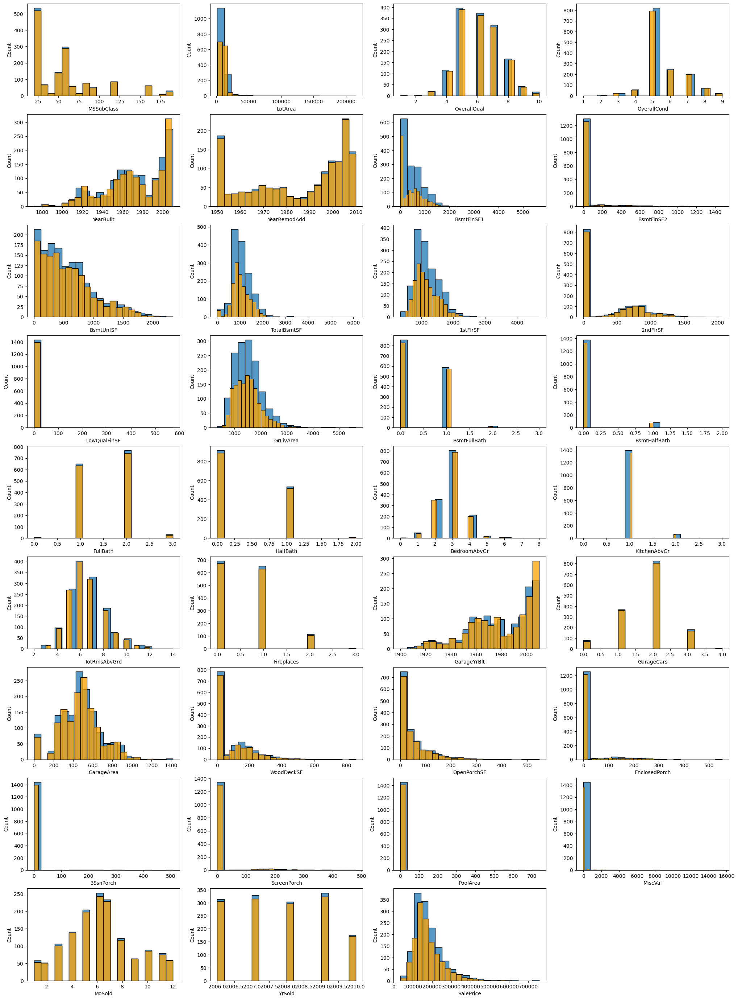

In [255]:
# creating a subplot to visualize the columns in histplot
plt.figure(figsize=(25,35))
for i, var in enumerate(df4_num_index):
    plt.subplot(9,4,i+1)
    sns.histplot(df[var],bins=20)
    sns.histplot(df4[var],bins=20,color='orange')
  
  

In [256]:
df4_num.columns

Index(['MSSubClass', 'LotArea', 'OverallQual', 'OverallCond', 'YearBuilt',
       'YearRemodAdd', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF',
       '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath',
       'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr',
       'TotRmsAbvGrd', 'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea',
       'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch',
       'ScreenPorch', 'PoolArea', 'MiscVal', 'MoSold', 'YrSold', 'SalePrice'],
      dtype='object')

In [257]:
df4_num.shape

(1412, 35)

In [258]:
df4.shape

(1412, 74)

In [121]:
#now we will select object columns
df4_obj=df4.select_dtypes(include=['object'])
df4_obj.head()

,MSZoning,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,Heating,HeatingQC,CentralAir,Electrical,KitchenQual,Functional,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,SaleType,SaleCondition
0,RL,Pave,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,Attchd,RFn,TA,TA,Y,WD,Normal
1,RL,Pave,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,Unf,GasA,Ex,Y,SBrkr,TA,Typ,Attchd,RFn,TA,TA,Y,WD,Normal
2,RL,Pave,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,Attchd,RFn,TA,TA,Y,WD,Normal
3,RL,Pave,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,Unf,GasA,Gd,Y,SBrkr,Gd,Typ,Detchd,Unf,TA,TA,Y,WD,Abnorml
4,RL,Pave,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,Attchd,RFn,TA,TA,Y,WD,Normal


In [260]:
df4_obj.shape

(1412, 39)

In [122]:
# checking for 1st column
df['MSZoning'].value_counts()


RL         1151
RM          218
FV           65
RH           16
C (all)      10
Name: MSZoning, dtype: int64

In [124]:
df4['MSZoning'].value_counts()

RL         1119
RM          207
FV           64
RH           15
C (all)       7
Name: MSZoning, dtype: int64

In [125]:
# data destribution in percentage in oreginal df is as:
df_per_obj= (df['MSZoning'].value_counts()/df.shape[0])*100
df_per_obj

RL         78.835616
RM         14.931507
FV          4.452055
RH          1.095890
C (all)     0.684932
Name: MSZoning, dtype: float64

<AxesSubplot:xlabel='MSZoning', ylabel='Count'>

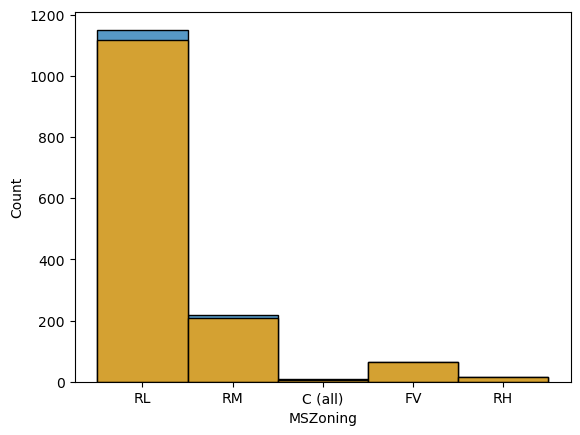

In [126]:
# checking in data destribution change in first column 
sns.histplot(df["MSZoning"])
sns.histplot(df4["MSZoning"],color='orange')


In [ ]:
# we can see that there in no change

In [127]:
df4_per_obj=(df4["MSZoning"].value_counts()/df4.shape[0])*100
df4_per_obj

RL         79.249292
RM         14.660057
FV          4.532578
RH          1.062323
C (all)     0.495751
Name: MSZoning, dtype: float64

In [128]:
# here we will check percentage wise changes of data
#in oreginal and cleaned columns
df4_obj_1=pd.concat([df_per_obj,df4_per_obj],axis=1,
                    keys=['MSZoning_Org','MSZoning_Clean'])
df4_obj_1

,MSZoning_Org,MSZoning_Clean
RL,78.835616,79.249292
RM,14.931507,14.660057
FV,4.452055,4.532578
RH,1.095890,1.062323
C (all),0.684932,0.495751


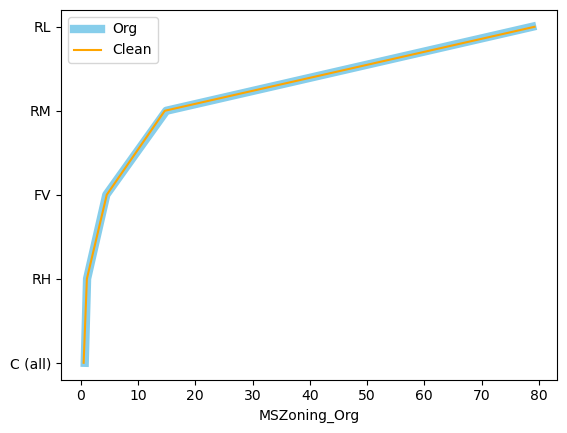

In [129]:
# we will visualize the changes with the help of lineplot
sns.lineplot(x='MSZoning_Org',y=df4_obj_1.index,data=df4_obj_1,linewidth=6,color="skyblue",label='Org')
sns.lineplot(x=df4_obj_1['MSZoning_Clean'],y=df4_obj_1.index,color='orange',label='Clean')
plt.legend()


In [130]:
# now we apply same method on all the object columns
# Initially we convert the destribution in percentage 
def obj_dist_chk(var):
  return pd.concat([(df[var].value_counts()/df.shape[0])*100,
                    (df4[var].value_counts()/df4.shape[0])*100],
                   axis=1,keys=[var+'_Org',var+'_clean'])

In [131]:
# now ccolumnwise compairing oreginal and clean data with the help of for loop
for col in df4_obj:
    x=obj_dist_chk(col)
    #sns.displot(x)
    #plt.show()
    print(obj_dist_chk(col))
    print("_"*50)

         MSZoning_Org  MSZoning_clean
RL          78.835616       79.249292
RM          14.931507       14.660057
FV           4.452055        4.532578
RH           1.095890        1.062323
C (all)      0.684932        0.495751
__________________________________________________
      Street_Org  Street_clean
Pave   99.589041     99.645892
Grvl    0.410959      0.354108
__________________________________________________
     LotShape_Org  LotShape_clean
Reg     63.356164       63.668555
IR1     33.150685       32.932011
IR2      2.808219        2.832861
IR3      0.684932        0.566572
__________________________________________________
     LandContour_Org  LandContour_clean
Lvl        89.794521          90.084986
Bnk         4.315068           4.178470
HLS         3.424658           3.470255
Low         2.465753           2.266289
__________________________________________________
        Utilities_Org  Utilities_clean
AllPub      99.931507        99.929178
NoSeWa       0.068493      

     BsmtFinType2_Org  BsmtFinType2_clean
Unf         86.027397           88.881020
Rec          3.698630            3.682720
LwQ          3.150685            2.974504
BLQ          2.260274            2.266289
ALQ          1.301370            1.274788
GLQ          0.958904            0.920680
__________________________________________________
       Heating_Org  Heating_clean
GasA     97.808219      98.087819
GasW      1.232877       0.991501
Grav      0.479452       0.495751
Wall      0.273973       0.283286
OthW      0.136986       0.070822
Floor     0.068493       0.070822
__________________________________________________
    HeatingQC_Org  HeatingQC_clean
Ex      50.753425        50.849858
TA      29.315068        29.320113
Gd      16.506849        16.572238
Fa       3.356164         3.186969
Po       0.068493         0.070822
__________________________________________________
   CentralAir_Org  CentralAir_clean
Y       93.493151         94.050992
N        6.506849          5.9490

In [132]:
df4_obj.shape

(1412, 39)

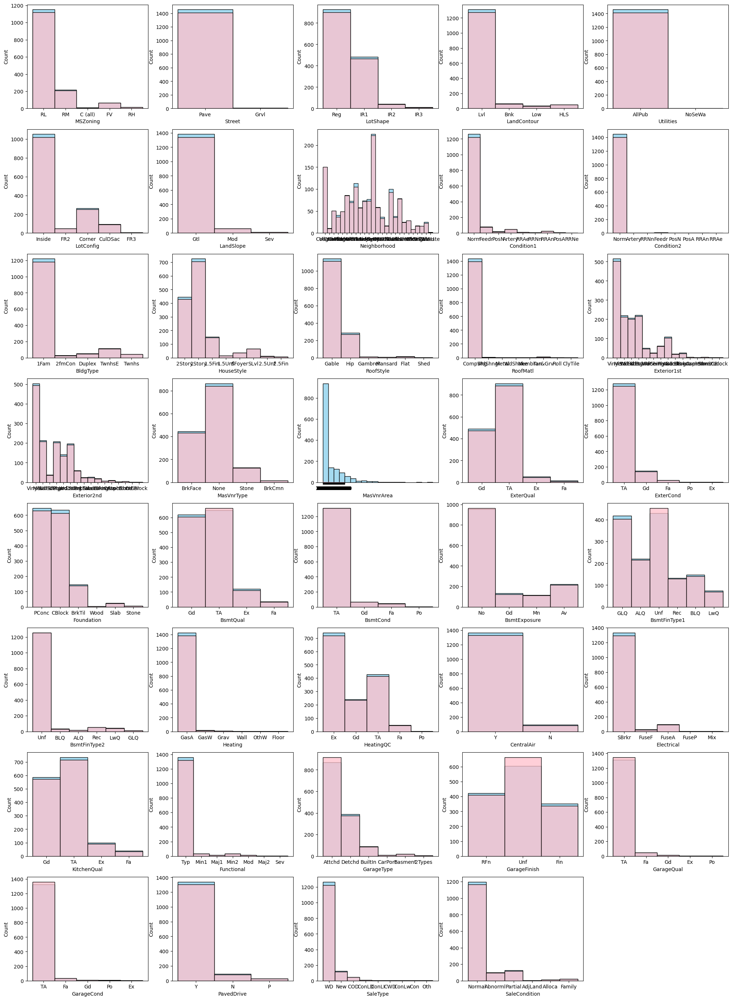

In [140]:
# here we create sub plot for compairing the columns
plt.figure(figsize=(25,35))
for i, var in enumerate(df4_obj.columns):
    plt.subplot(8,5,i+1)
    sns.histplot(df[var],bins=20,color='skyblue')
    sns.histplot(df4[var],bins=20,color='pink')

In [ ]:
# we can see that there is no changes in data destribution

In [133]:
df4_obj.columns

Index(['MSZoning', 'Street', 'LotShape', 'LandContour', 'Utilities',
       'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2',
       'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st',
       'Exterior2nd', 'MasVnrType', 'MasVnrArea', 'ExterQual', 'ExterCond',
       'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1',
       'BsmtFinType2', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical',
       'KitchenQual', 'Functional', 'GarageType', 'GarageFinish', 'GarageQual',
       'GarageCond', 'PavedDrive', 'SaleType', 'SaleCondition'],
      dtype='object')

In [134]:
# in above sub plot we can see that 'MasVnrArea' 
#is not display the clean data bars
# so here we will check that
df4['MasVnrArea'].info()

<class 'pandas.core.series.Series'>
Int64Index: 1412 entries, 0 to 1458
Series name: MasVnrArea
Non-Null Count  Dtype 
--------------  ----- 
1412 non-null   object
dtypes: object(1)
memory usage: 22.1+ KB


In [135]:
# in df4 dataframe 'MasVnrArea' column is of object datatype
#But in oreginal data it in float64 format 
# so we will convert it into float64
MasVnrArea=df4['MasVnrArea'].astype(float)

<AxesSubplot:xlabel='MasVnrArea', ylabel='Count'>

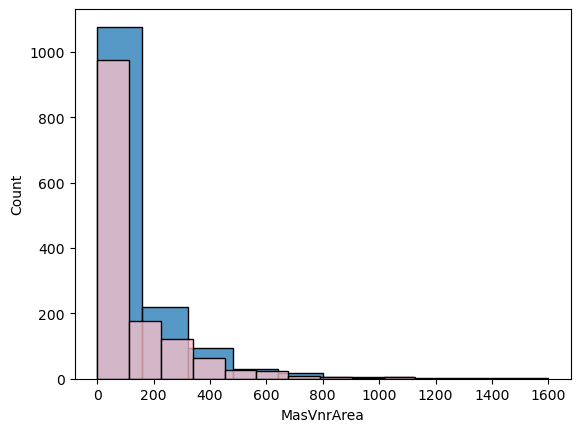

In [136]:
# now we will check it with histplot
sns.histplot(df['MasVnrArea'],bins=10)
sns.histplot(MasVnrArea,color='pink',bins=10)

In [137]:
df4_obj.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1412 entries, 0 to 1458
Data columns (total 39 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   MSZoning       1412 non-null   object
 1   Street         1412 non-null   object
 2   LotShape       1412 non-null   object
 3   LandContour    1412 non-null   object
 4   Utilities      1412 non-null   object
 5   LotConfig      1412 non-null   object
 6   LandSlope      1412 non-null   object
 7   Neighborhood   1412 non-null   object
 8   Condition1     1412 non-null   object
 9   Condition2     1412 non-null   object
 10  BldgType       1412 non-null   object
 11  HouseStyle     1412 non-null   object
 12  RoofStyle      1412 non-null   object
 13  RoofMatl       1412 non-null   object
 14  Exterior1st    1412 non-null   object
 15  Exterior2nd    1412 non-null   object
 16  MasVnrType     1412 non-null   object
 17  MasVnrArea     1412 non-null   object
 18  ExterQual      1412 non-null

In [156]:
df4_obj.shape

(1412, 39)

# categorical to numeric conversion

In [138]:
#Now we will convert our categorical data into numerical type
#first we apply it to only one column
from sklearn.preprocessing import LabelEncoder
le=LabelEncoder()
x=le.fit_transform(df4_obj['MSZoning'])

In [278]:
#converted data is a numpy array
x[:10]

array([3, 3, 3, 3, 3, 3, 3, 3, 4, 3])

In [279]:
#Therefor we convert numpy array in pandas dataframe
pd.DataFrame({'MSZoning':x}).shape

(1412, 1)

In [280]:
pd.DataFrame({'MSZoning':x}).head()

,MSZoning
0,3
1,3
2,3
3,3
4,3


In [161]:
df4_obj['MSZoning'].value_counts()

RL         1119
RM          207
FV           64
RH           15
C (all)       7
Name: MSZoning, dtype: int64

In [ ]:
#selecting columns name in object df4_obj_colname

In [139]:
df4_obj_colname=df4_obj.columns

In [140]:
df4_obj.head()

,MSZoning,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,Heating,HeatingQC,CentralAir,Electrical,KitchenQual,Functional,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,SaleType,SaleCondition
0,RL,Pave,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,Attchd,RFn,TA,TA,Y,WD,Normal
1,RL,Pave,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,Unf,GasA,Ex,Y,SBrkr,TA,Typ,Attchd,RFn,TA,TA,Y,WD,Normal
2,RL,Pave,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,Attchd,RFn,TA,TA,Y,WD,Normal
3,RL,Pave,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,Unf,GasA,Gd,Y,SBrkr,Gd,Typ,Detchd,Unf,TA,TA,Y,WD,Abnorml
4,RL,Pave,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,Attchd,RFn,TA,TA,Y,WD,Normal


In [283]:
df4_obj['MasVnrArea'].info()

<class 'pandas.core.series.Series'>
Int64Index: 1412 entries, 0 to 1458
Series name: MasVnrArea
Non-Null Count  Dtype 
--------------  ----- 
1412 non-null   object
dtypes: object(1)
memory usage: 22.1+ KB


In [141]:
df4_obj['MasVnrArea']=df4_obj['MasVnrArea'].astype(str)

In [143]:
df4_obj_colname


Index(['MSZoning', 'Street', 'LotShape', 'LandContour', 'Utilities',
       'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2',
       'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st',
       'Exterior2nd', 'MasVnrType', 'MasVnrArea', 'ExterQual', 'ExterCond',
       'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1',
       'BsmtFinType2', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical',
       'KitchenQual', 'Functional', 'GarageType', 'GarageFinish', 'GarageQual',
       'GarageCond', 'PavedDrive', 'SaleType', 'SaleCondition'],
      dtype='object')

In [144]:
le.fit_transform(df4_obj['MasVnrArea'])

array([81,  0, 56, ..., 22,  0,  0])

In [484]:
#creating a new dataframe df5
df5=pd.DataFrame()

In [487]:
df5=pd.concat([df5,df4],axis=0)


(4236, 74)

In [146]:
#now we will converting all categorical columns to numerical columns
for y in df4_obj_colname:
    df5[y]=le.fit_transform(df4_obj[y])

In [147]:
df5.head()

,MSSubClass,MSZoning,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,60,3,8450,1,3,3,0,4,0,5,2,2,0,5,7,5,2003,2003,1,0,12,13,1,81,2,4,2,2,3,3,2,706,5,0,150,856,1,0,1,4,856,854,0,1710,1,0,2,1,3,1,2,8,6,0,1,2003.0,1,2,548,4,4,2,0,61,0,0,0,0,0,2,2008,8,4,208500
1,20,3,9600,1,3,3,0,2,0,24,1,2,0,2,6,8,1976,1976,1,0,8,8,2,0,3,4,1,2,3,1,0,978,5,0,284,1262,1,0,1,4,1262,0,0,1262,0,1,2,0,3,1,3,6,6,1,1,1976.0,1,2,460,4,4,2,298,0,0,0,0,0,0,5,2007,8,4,181500
2,60,3,11250,1,0,3,0,4,0,5,2,2,0,5,7,5,2001,2002,1,0,12,13,1,56,2,4,2,2,3,2,2,486,5,0,434,920,1,0,1,4,920,866,0,1786,1,0,2,1,3,1,2,6,6,1,1,2001.0,1,2,608,4,4,2,0,42,0,0,0,0,0,9,2008,8,4,223500
3,70,3,9550,1,0,3,0,0,0,6,2,2,0,5,7,5,1915,1970,1,0,13,15,2,0,3,4,0,3,1,3,0,216,5,0,540,756,1,2,1,4,961,756,0,1717,1,0,1,0,3,1,2,7,6,1,5,1998.0,2,3,642,4,4,2,0,35,272,0,0,0,0,2,2006,8,0,140000
4,60,3,14260,1,0,3,0,2,0,15,2,2,0,5,8,5,2000,2000,1,0,12,13,1,181,2,4,2,2,3,0,2,655,5,0,490,1145,1,0,1,4,1145,1053,0,2198,1,0,2,1,4,1,2,9,6,1,1,2000.0,1,3,836,4,4,2,192,84,0,0,0,0,0,12,2008,8,4,250000


In [148]:
df5.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1412 entries, 0 to 1458
Data columns (total 74 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   MSSubClass     1412 non-null   int64  
 1   MSZoning       1412 non-null   int32  
 2   LotArea        1412 non-null   int64  
 3   Street         1412 non-null   int32  
 4   LotShape       1412 non-null   int32  
 5   LandContour    1412 non-null   int32  
 6   Utilities      1412 non-null   int32  
 7   LotConfig      1412 non-null   int32  
 8   LandSlope      1412 non-null   int32  
 9   Neighborhood   1412 non-null   int32  
 10  Condition1     1412 non-null   int32  
 11  Condition2     1412 non-null   int32  
 12  BldgType       1412 non-null   int32  
 13  HouseStyle     1412 non-null   int32  
 14  OverallQual    1412 non-null   int64  
 15  OverallCond    1412 non-null   int64  
 16  YearBuilt      1412 non-null   int64  
 17  YearRemodAdd   1412 non-null   int64  
 18  RoofStyl

<AxesSubplot:xlabel='SalePrice', ylabel='GarageCars'>

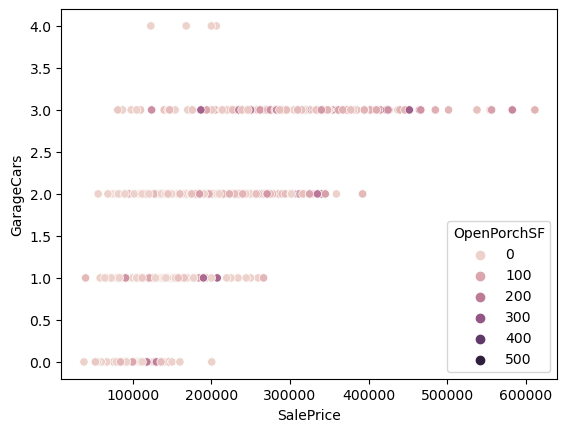

In [181]:
sns.scatterplot(x='SalePrice',y="GarageCars",hue='OpenPorchSF',data=df5)

In [291]:
df5.columns

Index(['MSSubClass', 'MSZoning', 'LotArea', 'Street', 'LotShape',
       'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood',
       'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'OverallQual',
       'OverallCond', 'YearBuilt', 'YearRemodAdd', 'RoofStyle', 'RoofMatl',
       'Exterior1st', 'Exterior2nd', 'MasVnrType', 'MasVnrArea', 'ExterQual',
       'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure',
       'BsmtFinType1', 'BsmtFinSF1', 'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF',
       'TotalBsmtSF', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical',
       '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath',
       'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr',
       'KitchenQual', 'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDrive', 'WoodDeckSF', 'OpenPorchSF',
       'EnclosedPorc

In [149]:
# now we will devide the data as input and outpot
X_Variables=df5.drop(['SalePrice'],axis=1)

In [150]:
X_Variables.columns

Index(['MSSubClass', 'MSZoning', 'LotArea', 'Street', 'LotShape',
       'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood',
       'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'OverallQual',
       'OverallCond', 'YearBuilt', 'YearRemodAdd', 'RoofStyle', 'RoofMatl',
       'Exterior1st', 'Exterior2nd', 'MasVnrType', 'MasVnrArea', 'ExterQual',
       'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure',
       'BsmtFinType1', 'BsmtFinSF1', 'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF',
       'TotalBsmtSF', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical',
       '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath',
       'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr',
       'KitchenQual', 'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDrive', 'WoodDeckSF', 'OpenPorchSF',
       'EnclosedPorc

In [ ]:
# creating scatter plot with respect of y that is 'SalePrice'
plt.figure(figsize=(30,50))
for item in (df5.columns):
    print(item)
    sns.scatterplot(x=i,y='SalePrice',data=df5)
    print("_"*40)

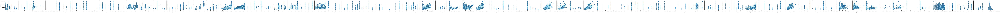

In [297]:
sns.pairplot(df5, x_vars=df5.columns,y_vars=['SalePrice'])

In [151]:
#Now we will check the Correlation in between each column
df5_corr=df5.corr()
df5_corr

,MSSubClass,MSZoning,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
MSSubClass,1.000000,0.033712,-0.224376,0.009313,0.119807,0.005413,-0.023277,0.085278,-0.032537,-0.006056,-0.018735,-0.061779,0.753164,0.400412,0.045122,-0.069857,0.046970,0.042293,-0.129865,-0.040691,-0.093965,-0.143272,-0.035633,0.027952,-0.020783,-0.000576,0.070090,-0.054498,0.006991,-0.062526,0.012529,-0.076685,0.046818,-0.060796,-0.139958,-0.258281,0.044638,0.021782,-0.102620,0.053136,-0.268486,0.306092,0.023322,0.072174,0.007886,-0.026320,0.130199,0.188882,-0.045524,0.262827,0.005100,0.023805,-0.000627,-0.047954,0.095608,0.107526,0.004836,-0.027098,-0.087172,0.010681,0.003502,-0.041558,-0.013475,0.000467,-0.014837,-0.030682,-0.032539,0.014959,-0.052865,-0.015192,-0.024357,0.012850,-0.021277,-0.082862
MSZoning,0.033712,1.000000,-0.049224,0.099360,0.067706,-0.023969,-0.001311,-0.009985,-0.024045,-0.262357,-0.027040,0.049342,-0.000215,-0.113606,-0.187487,0.186126,-0.326104,-0.187348,0.007017,-0.005672,-0.007447,0.005368,-0.032961,-0.067477,0.218974,-0.088951,-0.255375,0.139589,-0.022502,0.031635,0.018038,-0.043743,-0.033737,0.031490,-0.058284,-0.098273,0.054706,0.140827,-0.079627,-0.102101,-0.064062,-0.063025,-0.006121,-0.105012,-0.016013,0.023485,-0.221310,-0.147467,-0.017513,0.051512,0.141845,-0.054745,-0.097364,-0.014514,0.126683,-0.258917,0.178364,-0.178513,-0.212028,-0.142882,-0.084550,-0.110443,-0.016876,-0.160014,0.119611,0.001378,0.017299,-0.001311,0.003274,-0.020091,-0.032845,0.103662,-0.020461,-0.199058
LotArea,-0.224376,-0.049224,1.000000,-0.052326,-0.195844,-0.121442,0.015722,-0.141986,0.402380,-0.006555,0.040158,0.003028,-0.278676,-0.022311,0.097857,-0.001012,0.013342,0.039800,0.058043,0.185545,0.048977,0.036673,-0.038850,0.095191,-0.062405,0.014130,-0.004646,-0.057064,-0.000604,-0.144070,-0.028038,0.159593,-0.022263,0.056010,0.031606,0.227272,-0.016899,0.002913,0.048694,0.043712,0.292886,0.061887,-0.017534,0.274587,0.085265,0.082062,0.135116,0.024040,0.164160,-0.009312,-0.073245,0.210522,-0.047298,0.278797,-0.140982,-0.047652,-0.114496,0.184586,0.200401,0.025058,0.033515,0.000667,0.151495,0.105673,-0.023504,0.039381,0.067016,-0.000990,0.050793,-0.003750,-0.020882,0.010414,0.039860,0.288816
Street,0.009313,0.099360,-0.052326,1.000000,-0.027551,0.100682,0.001587,-0.006432,-0.121684,0.007987,-0.080692,0.000819,-0.015191,0.007385,0.057408,0.053344,0.022235,0.061476,-0.029522,0.006865,0.000820,0.006080,0.015601,0.024762,0.066493,0.011773,0.032983,-0.021728,-0.016416,0.067921,-0.032664,0.002711,0.020891,-0.038021,0.026840,0.017468,0.006820,-0.070653,0.085815,0.028085,0.020582,0.047559,0.006467,0.058460,-0.020906,0.014317,0.061982,0.021427,0.034866,0.012667,-0.018104,0.056518,-0.015252,0.019301,-0.006299,0.011060,-0.027130,-0.018927,-0.051975,-0.012681,-0.011103,0.033011,0.035148,-0.016466,0.021644,0.007051,-0.043128,0.001587,-0.038413,0.011751,-0.026112,0.019144,0.009730,0.055195
LotShape,0.119807,0.067706,-0.195844,-0.027551,1.000000,0.086668,-0.036889,0.223715,-0.096519,-0.031990,-0.116497,-0.019045,0.113895,-0.102261,-0.186723,0.016706,-0.228406,-0.158758,0.008041,-0.042100,-0.019824,-0.031600,0.002494,-0.089227,0.152919,-0.032365,-0.138639,0.159752,-0.009049,0.138225,0.083348,-0.125596,0.021517,-0.033898,-0.023469,-0.173393,0.0747

In [152]:
df5_corr.columns

Index(['MSSubClass', 'MSZoning', 'LotArea', 'Street', 'LotShape',
       'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood',
       'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'OverallQual',
       'OverallCond', 'YearBuilt', 'YearRemodAdd', 'RoofStyle', 'RoofMatl',
       'Exterior1st', 'Exterior2nd', 'MasVnrType', 'MasVnrArea', 'ExterQual',
       'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure',
       'BsmtFinType1', 'BsmtFinSF1', 'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF',
       'TotalBsmtSF', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical',
       '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath',
       'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr',
       'KitchenQual', 'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDrive', 'WoodDeckSF', 'OpenPorchSF',
       'EnclosedPorc

<AxesSubplot:>

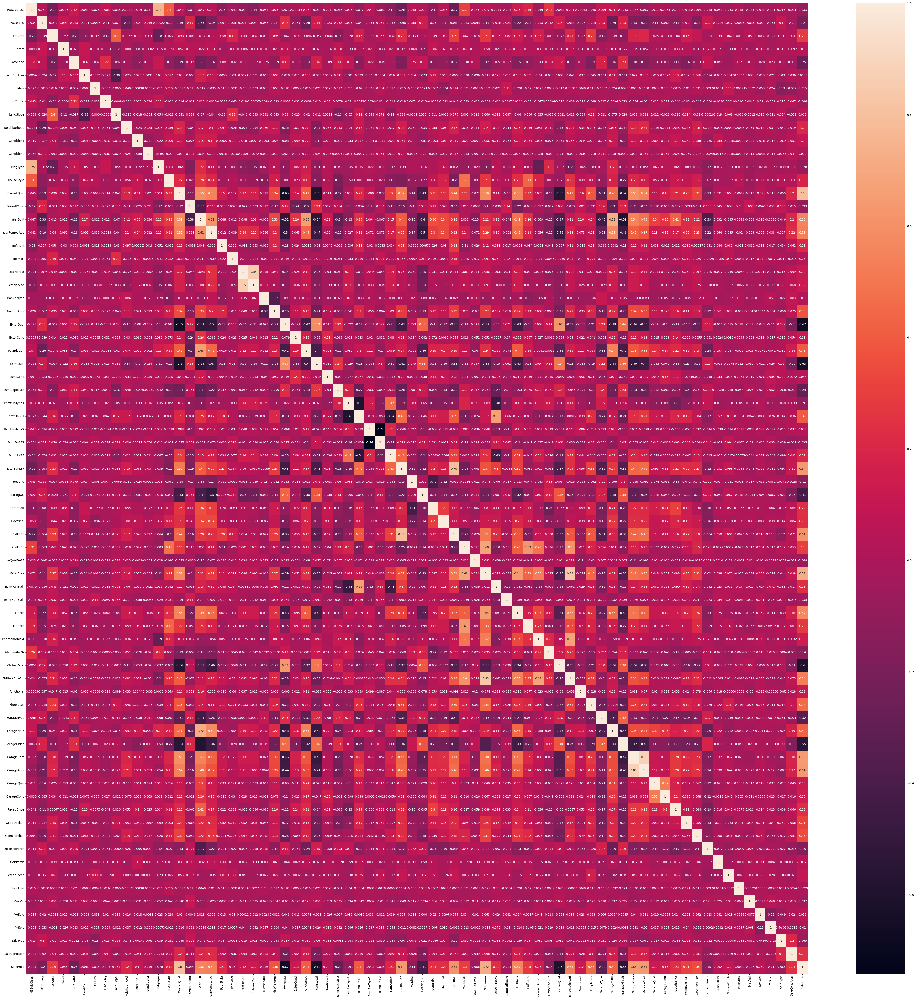

In [260]:
# checking correlation with the help of heatmap
plt.figure(figsize=(60,60))
sns.heatmap(df5.corr(),annot=True)

In [204]:
# the important point is to check corr with SalePrice
# so we select this column
df5_corr['SalePrice']

MSSubClass      -0.082862
MSZoning        -0.199058
LotArea          0.288816
Street           0.055195
LotShape        -0.247218
LandContour      0.008272
Utilities       -0.014945
LotConfig       -0.046190
LandSlope        0.060588
Neighborhood     0.201586
Condition1       0.103976
Condition2       0.018977
BldgType        -0.077965
HouseStyle       0.184233
OverallQual      0.799717
OverallCond     -0.093376
YearBuilt        0.556696
YearRemodAdd     0.531439
RoofStyle        0.213978
RoofMatl         0.049721
Exterior1st      0.116162
Exterior2nd      0.124878
MasVnrType       0.035851
MasVnrArea       0.375297
ExterQual       -0.669025
ExterCond        0.128822
Foundation       0.407451
BsmtQual        -0.630705
BsmtCond         0.044084
BsmtExposure    -0.292311
BsmtFinType1    -0.091105
BsmtFinSF1       0.396471
BsmtFinType2     0.043133
BsmtFinSF2      -0.035149
BsmtUnfSF        0.205667
TotalBsmtSF      0.635830
Heating         -0.114911
HeatingQC       -0.411860
CentralAir  

In [153]:
# we want to see highly correlated columns 
#for that we select these columns 
df5_highly_corr=df5_corr[(df5_corr['SalePrice']>=0.6) 
                         | (df5_corr['SalePrice']<=-0.6)]

In [154]:
df5_highly_corr

,MSSubClass,MSZoning,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
OverallQual,0.045122,-0.187487,0.097857,0.057408,-0.186723,0.030077,-0.001735,-0.014461,-0.040658,0.193298,0.106275,0.019671,0.063592,0.216891,1.000000,-0.115513,0.591222,0.547988,0.151942,0.032026,0.168702,0.164152,0.010621,0.342255,-0.653223,0.135185,0.409638,-0.602387,0.041304,-0.244102,0.016905,0.209628,0.088462,-0.077408,0.298259,0.520002,-0.137712,-0.426512,0.251610,0.232498,0.441498,0.278858,-0.072462,0.575268,0.107337,-0.059992,0.553803,0.269690,0.072956,-0.185866,-0.561803,0.407057,0.155604,0.380812,-0.311734,0.456218,-0.538389,0.592139,0.543795,0.107541,0.150458,0.211751,0.232144,0.315403,-0.134265,0.031129,0.054546,-0.001735,-0.047688,0.070321,-0.015744,-0.059012,0.199811,0.799717
ExterQual,-0.020783,0.218974,-0.062405,0.066493,0.152919,-0.028400,0.017576,-0.005791,0.029598,-0.160627,-0.080050,-0.026515,-0.103738,-0.086502,-0.653223,0.166168,-0.516491,-0.497261,-0.176957,0.015886,-0.135528,-0.107348,-0.090712,-0.286876,1.000000,-0.079179,-0.415463,0.587110,0.016158,0.218846,-0.021650,-0.176604,-0.067756,0.076938,-0.250742,-0.432974,0.053448,0.433184,-0.099587,-0.170778,-0.354609,-0.135544,0.023397,-0.386271,-0.106016,0.070867,-0.426102,-0.148590,0.062856,0.119667,0.624376,-0.276540,-0.065076,-0.212528,0.228885,-0.478664,0.462021,-0.463140,-0.440492,-0.090077,-0.102546,-0.121931,-0.172594,-0.261157,0.130581,-0.065573,-0.015469,0.017576,-0.010389,-0.043060,-0.040264,0.086723,-0.195577,-0.669025
BsmtQual,-0.054498,0.139589,-0.057064,-0.021728,0.159752,-0.012927,0.022239,0.014716,0.011363,-0.167190,-0.102467,0.023615,-0.111912,-0.148757,-0.602387,0.226580,-0.535008,-0.473874,-0.114254,0.010077,-0.161942,-0.143818,-0.111096,-0.240586,0.587110,-0.148548,-0.403902,1.000000,0.019320,0.269786,-0.028980,-0.228145,-0.097990,0.103444,-0.190787,-0.412674,0.075074,0.384990,-0.129030,-0.155426,-0.327293,-0.120601,0.056686,-0.349471,-0.150216,0.061101,-0.434317,-0.134543,0.094159,0.115996,0.503077,-0.233593,-0.082932,-0.187624,0.224954,-0.476676,0.459380,-0.485157,-0.435483,-0.043193,-0.046773,-0.140583,-0.225327,-0.245602,0.146272,-0.026175,-0.007764,0.022239,0.050941,-0.011333,0.026268,0.060427,-0.185261,-0.630705
TotalBsmtSF,-0.258281,-0.098273,0.227272,0.017468,-0.173393,0.050512,-0.015055,-0.019310,0.037638,0.151475,0.062874,0.030378,-0.039395,-0.171303,0.520002,-0.185166,0.403460,0.289506,0.233550,0.066830,0.059768,0.051836,0.000992,0.282533,-0.432974,0.110078,0.166848,-0.412674,0.030129,-0.276770,-0.191324,0.462310,-0.045938,0.092400,0.429790,1.000000,-0.149597,-0.224610,0.203247,0.159984,0.790929,-0.246193,-0.044852,0.373483,0.296051,-0.008335,0.312929,-0.085416,0.021693,-0.067819,-0.373095,0.239943,0.055950,0.311738,-0.353814,0.274458,-0.358329,0.440627,0.460777,0.095098,0.110522,0.215255,0.224738,0.228540,-0.122828,0.030588,0.097558,0.003448,-0.048398,0.025420,-0.011234,-0.097076,0.112476,0.635830
1stFlrSF,-0.268486,-0.064062,0.292886,0.020582,-0.165971,-0.009260,0.014143,-0.043273,0.075497,0.167689,0.049062,0.017168,-0.063866,-0.201922,0.441498,-0.155792,0.275146,0.231428,0.281848,0.151854,0.014449,0.029670,-0.024010,0.286741,-0.354609,0.055456,0.192895,-0.327293,0.020236,-0.234271,-0.108504,0.387628,-0.027999,0.089684,0.312421,0.790929,-

In [155]:
df5_highly_corr.shape

(10, 74)

In [156]:
# By using transpose we convert columns into rows
df5_highly_corr_t=df5_highly_corr.transpose()

In [157]:
df5_highly_corr_t.shape

(74, 10)

In [158]:
#now again we will selwct highly corelated columns
# by applying this method we will get a metrix of highly corelated columns
df5_highly_corr=df5_highly_corr_t[(df5_highly_corr_t['SalePrice']>=0.6) | (df5_highly_corr_t['SalePrice']<=-0.6)]

In [262]:
# Now in this metrix all the columns are highly corelated with each other  
df5_highly_corr

,OverallQual,ExterQual,BsmtQual,TotalBsmtSF,1stFlrSF,GrLivArea,KitchenQual,GarageCars,GarageArea,SalePrice
OverallQual,1.000000,-0.653223,-0.602387,0.520002,0.441498,0.575268,-0.561803,0.592139,0.543795,0.799717
ExterQual,-0.653223,1.000000,0.587110,-0.432974,-0.354609,-0.386271,0.624376,-0.463140,-0.440492,-0.669025
BsmtQual,-0.602387,0.587110,1.000000,-0.412674,-0.327293,-0.349471,0.503077,-0.485157,-0.435483,-0.630705
TotalBsmtSF,0.520002,-0.432974,-0.412674,1.000000,0.790929,0.373483,-0.373095,0.440627,0.460777,0.635830
1stFlrSF,0.441498,-0.354609,-0.327293,0.790929,1.000000,0.507332,-0.334454,0.435757,0.463194,0.607396
GrLivArea,0.575268,-0.386271,-0.349471,0.373483,0.507332,1.000000,-0.361992,0.477924,0.455878,0.715528
KitchenQual,-0.561803,0.624376,0.503077,-0.373095,-0.334454,-0.361992,1.000000,-0.364120,-0.352261,-0.602432
GarageCars,0.592139,-0.463140,-0.485157,0.440627,0.435757,0.477924,-0.364120,1.000000,0.883495,0.649279
GarageArea,0.543795,-0.440492,-0.435483,0.460777,0.463194,0.455878,-0.352261,0.883495,1.000000,0.636311
SalePrice,0.799717,-0.669025,-0.630705,0.635830,0.607396,0.715528,-0.602432,0.649279,0.636311,1.000000


In [159]:
#check the shape
df5_highly_corr.shape

(10, 10)

<AxesSubplot:>

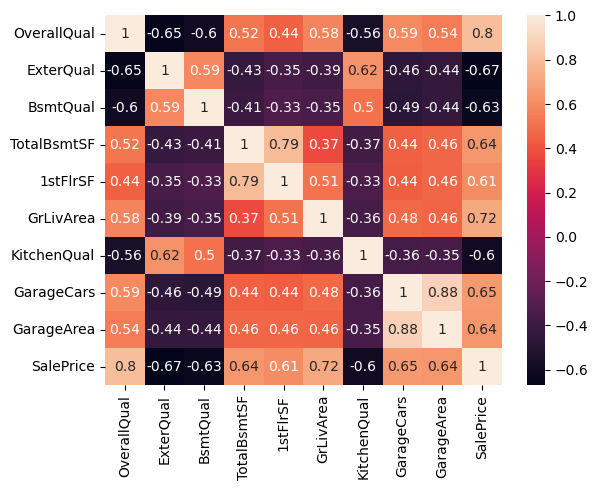

In [160]:
#now we will create a heatmap of df5_highly_corr
sns.heatmap(df5_highly_corr,annot=True)

In [161]:
# in above heatmap we can easily understand the corelation between columns
df5_highly_corr.columns

Index(['OverallQual', 'ExterQual', 'BsmtQual', 'TotalBsmtSF', '1stFlrSF',
       'GrLivArea', 'KitchenQual', 'GarageCars', 'GarageArea', 'SalePrice'],
      dtype='object')

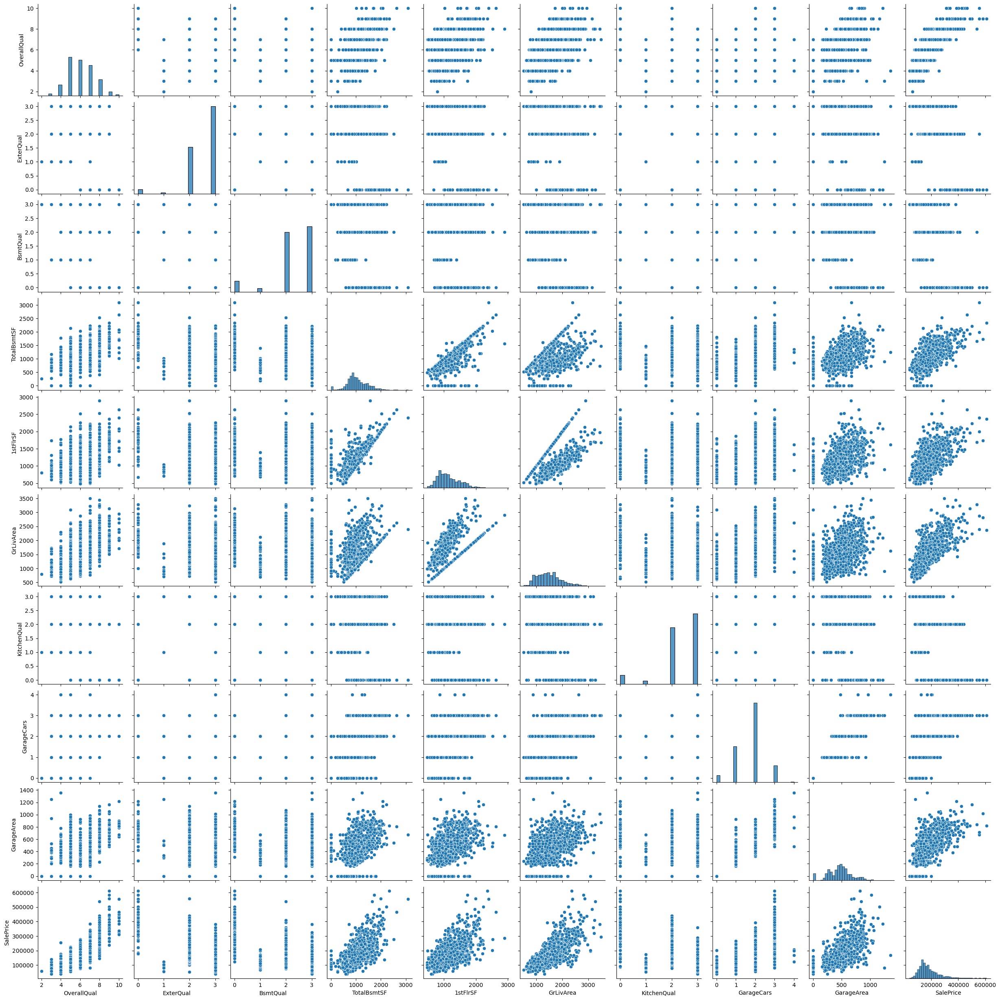

In [267]:
#creating pair plot 
sns.pairplot(df5, vars=df5[df5_highly_corr.columns])


In [163]:
df5_highly_corr.columns

Index(['OverallQual', 'ExterQual', 'BsmtQual', 'TotalBsmtSF', '1stFlrSF',
       'GrLivArea', 'KitchenQual', 'GarageCars', 'GarageArea', 'SalePrice'],
      dtype='object')

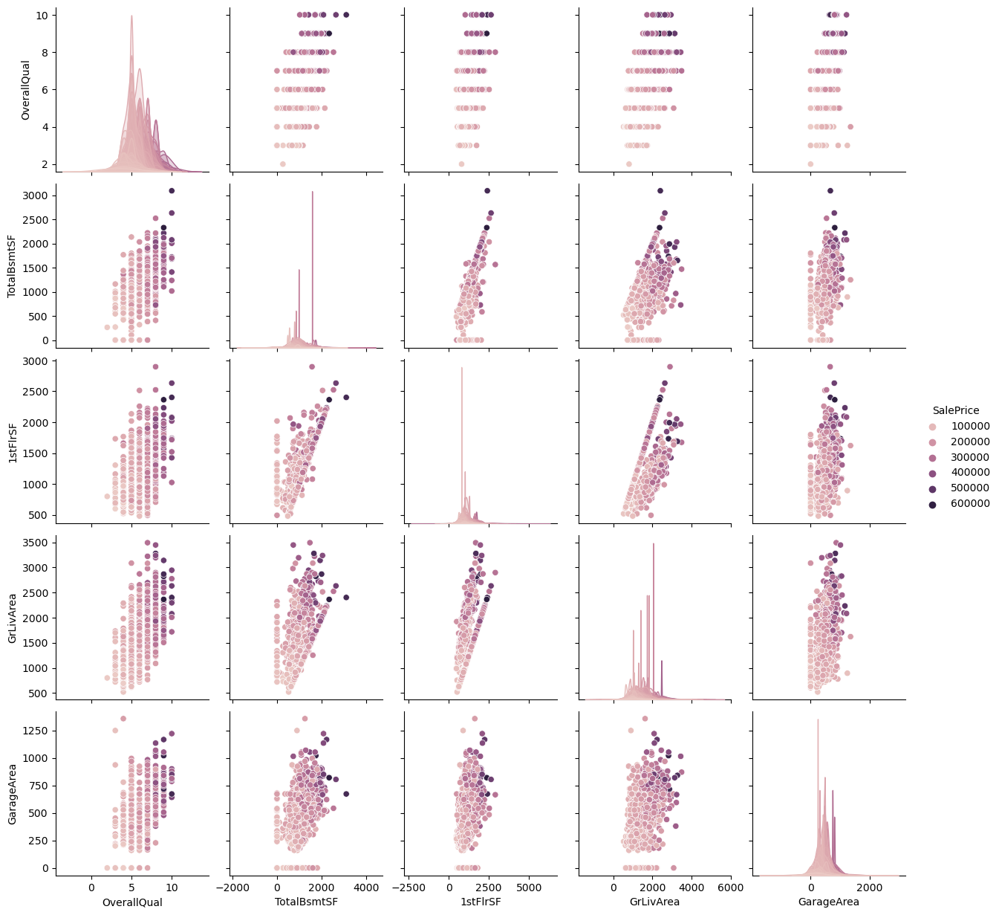

In [270]:
# pair plot with respect of hue= saleprice
sns.pairplot(df5,vars=['OverallQual', 'TotalBsmtSF',
             '1stFlrSF','GrLivArea', 'GarageArea',],hue="SalePrice")

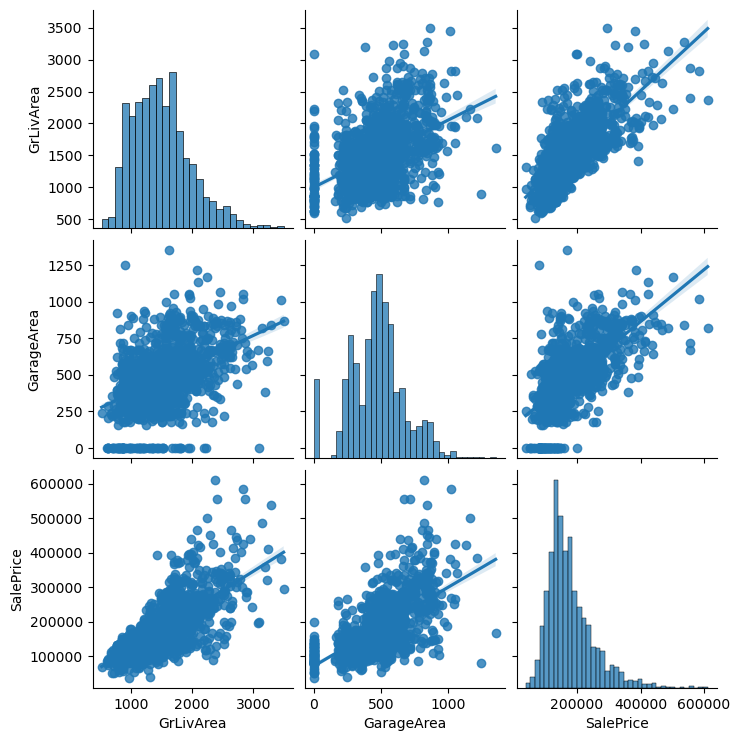

In [275]:
sns.pairplot(df5,vars=['GrLivArea', 'GarageArea',"SalePrice"],kind='reg')

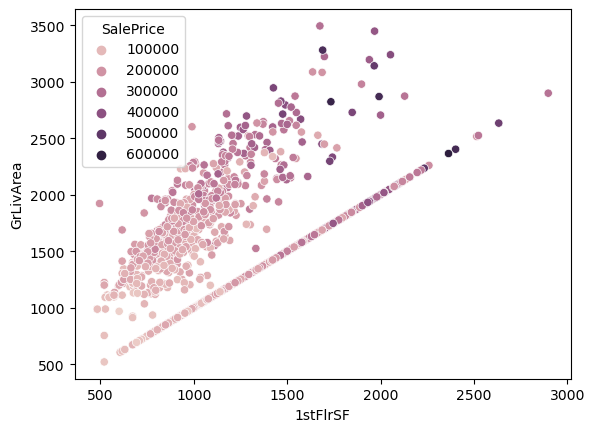

In [269]:
sns.scatterplot(x='1stFlrSF',y='GrLivArea',data=df5,hue='SalePrice')
plt.show()

In [299]:
#selecting x and y variables 
x=df5.drop(columns=['SalePrice'])
x.columns

Index(['MSSubClass', 'MSZoning', 'LotArea', 'Street', 'LotShape',
       'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood',
       'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'OverallQual',
       'OverallCond', 'YearBuilt', 'YearRemodAdd', 'RoofStyle', 'RoofMatl',
       'Exterior1st', 'Exterior2nd', 'MasVnrType', 'MasVnrArea', 'ExterQual',
       'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure',
       'BsmtFinType1', 'BsmtFinSF1', 'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF',
       'TotalBsmtSF', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical',
       '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath',
       'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr',
       'KitchenQual', 'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDrive', 'WoodDeckSF', 'OpenPorchSF',
       'EnclosedPorc

In [372]:
x.shape

(1412, 73)

In [488]:
#now we go for feature scaling process by using StandardScaler
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()
scaled_x=scaler.fit_transform(x)
scaled_x[:1]

array([[ 0.08315603, -0.04925822, -0.23689573,  0.05961258,  0.7464479 ,
         0.31051966, -0.02662174,  0.60256874, -0.2246664 , -1.19777917,
        -0.0369298 , -0.01374384, -0.41058212,  1.02694563,  0.68302792,
        -0.53145055,  1.05436718,  0.87573897, -0.48344696, -0.11515258,
         0.74066555,  0.74848332, -1.23503268,  0.20864471, -0.81948323,
         0.35799731,  0.83929335, -0.34181434,  0.27537293,  0.62175537,
        -0.42894355,  0.63339856,  0.30322964, -0.28689824, -0.95535965,
        -0.47267632, -0.11440238, -0.88425869,  0.25150152,  0.29837371,
        -0.8240712 ,  1.21058366, -0.10849138,  0.44748312,  1.13606091,
        -0.24016224,  0.81628952,  1.24161551,  0.17370769, -0.21248939,
        -0.43310243,  0.96707775,  0.25586026, -0.94957939, -0.68910694,
         0.93928217, -0.28608552,  0.31750527,  0.367093  ,  0.21272182,
         0.18624765,  0.28072006, -0.76464915,  0.24436639, -0.3630797 ,
        -0.11828602, -0.27326211, -0.02662174, -0.1

In [489]:
scaled_x.shape

(1412, 73)

In [490]:
scaled_x=pd.DataFrame(scaled_x,columns=x.columns)

In [491]:
scaled_x.head()

,MSSubClass,MSZoning,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,0.083156,-0.049258,-0.236896,0.059613,0.746448,0.31052,-0.026622,0.602569,-0.224666,-1.197779,-0.036930,-0.013744,-0.410582,1.026946,0.683028,-0.531451,1.054367,0.875739,-0.483447,-0.115153,0.740666,0.748483,-1.235033,0.208645,-0.819483,0.357997,0.839293,-0.341814,0.275373,0.621755,-0.428944,0.633399,0.30323,-0.286898,-0.955360,-0.472676,-0.114402,-0.884259,0.251502,0.298374,-0.824071,1.210584,-0.108491,0.447483,1.136061,-0.240162,0.81629,1.241616,0.173708,-0.212489,-0.433102,0.967078,0.25586,-0.949579,-0.689107,0.939282,-0.286086,0.317505,0.367093,0.212722,0.186248,0.28072,-0.764649,0.244366,-0.363080,-0.118286,-0.273262,-0.026622,-0.147762,-1.608431,0.137351,0.314838,0.204349
1,-0.874367,-0.049258,-0.076294,0.059613,0.746448,0.31052,-0.026622,-0.634099,-0.224666,1.960355,-1.195705,-0.013744,-0.410582,-0.542370,-0.065176,2.194003,0.145433,-0.431082,-0.483447,-0.115153,-0.516707,-0.668977,0.387168,-0.642303,0.660197,0.357997,-0.553283,-0.341814,0.275373,-1.139365,-1.514371,1.269695,0.30323,-0.286898,-0.646850,0.546062,-0.114402,-0.884259,0.251502,0.298374,0.303507,-0.797803,-0.108491,-0.491208,-0.827364,4.163852,0.81629,-0.759710,0.173708,-0.212489,0.794891,-0.309700,0.25586,0.614955,-0.689107,-0.161083,-0.286086,0.317505,-0.057590,0.212722,0.186248,0.28072,1.695766,-0.726875,-0.363080,-0.118286,-0.273262,-0.026622,-0.147762,-0.494234,-0.614353,0.314838,0.204349
2,0.083156,-0.049258,0.154134,0.059613,-1.385685,0.31052,-0.026622,0.602569,-0.224666,-1.197779,-0.036930,-0.013744,-0.410582,1.026946,0.683028,-0.531451,0.987039,0.827338,-0.483447,-0.115153,0.740666,0.748483,-1.235033,-0.053993,-0.819483,0.357997,0.839293,-0.341814,0.275373,-0.258805,-0.428944,0.118747,0.30323,-0.286898,-0.301503,-0.312087,-0.114402,-0.884259,0.251502,0.298374,-0.646325,1.238805,-0.108491,0.606725,1.136061,-0.240162,0.81629,1.241616,0.173708,-0.212489,-0.433102,-0.309700,0.25586,0.614955,-0.689107,0.857774,-0.286086,0.317505,0.656650,0.212722,0.186248,0.28072,-0.764649,-0.058151,-0.363080,-0.118286,-0.273262,-0.026622,-0.147762,0.991362,0.137351,0.314838,0.204349
3,0.322537,-0.049258,-0.083277,0.059613,-1.385685,0.31052,-0.026622,-1.870766,-0.224666,-1.031562,-0.036930,-0.013744,-0.410582,1.026946,0.683028,-0.531451,-1.908084,-0.721487,-0.483447,-0.115153,1.055009,1.315467,0.387168,-0.642303,0.660197,0.357997,-1.945859,0.835361,-2.873020,0.621755,-1.514371,-0.512870,0.30323,-0.286898,-0.057458,-0.723597,-0.114402,0.265440,0.251502,0.298374,-0.532456,0.980113,-0.108491,0.462150,1.136061,-0.240162,-1.03975,-0.759710,0.173708,-0.212489,-0.433102,0.328689,0.25586,0.614955,1.581649,0.735511,0.949244,1.684327,0.820732,0.212722,0.186248,0.28072,-0.764649,-0.169605,4.280935,-0.118286,-0.273262,-0.026622,-0.147762,-1.608431,-1.366056,0.314838,-3.471323
4,0.083156,-0.049258,0.574492,0.059613,-1.385685,0.31052,-0.026622,-0.634099,-0.224666,0.464397,-0.036930,-0.013744,-0.410582,1.026946,1.431232,-0.531451,0.953375,0.730537,-0.483447,-0.115153,0.740666,0.748483,-1.235033,1.259197,-0.819483,0.357997,0.839293,-0.341814,0.275373,-2.019925,-0.428944,0.514093,0.30323,-0.286898,-0.172574,0.252485,-0.114402,-0.884259,0.251502,0.298374,-0.021435,1.678580,-0.108491,1.469986,1.136061,-0.240162,0.8

In [307]:
#now dataframe is ready to process through model
# first we split in training and testing data
# here we consider the "SalePrice" as output that is y
#and rest of data will be consider as input that is X

In [381]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(scaled_x,
                                               y,test_size=.30,random_state=70)

In [382]:
print("shape of x_train",x_train.shape)
print("shape of x_test",x_test.shape)
print("shape of y_train",y_train.shape)
print("shape of y_test",y_test.shape)

shape of x_train (988, 73)
shape of x_test (424, 73)
shape of y_train (988,)
shape of y_test (424,)


In [494]:
from sklearn.linear_model import LinearRegression
LR=LinearRegression()
LR.fit(x_train,y_train)
y_train_pred= LR.predict(x_train)
y_test_pred=LR.predict(x_test)

In [498]:
from sklearn.metrics import r2_score, mean_squared_error
print(r2_score(y_train,y_train_pred),r2_score(y_test,y_test_pred))

0.0749169979263824 -1.3228241184985469e+24


In [500]:
mean_squared_error(y_test,y_LR_pred)

1.6392034284140975e+32

In [ ]:
#model 2
# here we will secect only highly correlated columns
# correlation >= +/- 0.60

In [388]:
# earler we calculated these dolumns
h_col=df5_highly_corr.columns
h_col

Index(['OverallQual', 'ExterQual', 'BsmtQual', 'TotalBsmtSF', '1stFlrSF',
       'GrLivArea', 'KitchenQual', 'GarageCars', 'GarageArea', 'SalePrice'],
      dtype='object')

In [389]:
x.head()

,MSSubClass,MSZoning,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,60,3,8450,1,3,3,0,4,0,5,2,2,0,5,7,5,2003,2003,1,0,12,13,1,81,2,4,2,2,3,3,2,706,5,0,150,856,1,0,1,4,856,854,0,1710,1,0,2,1,3,1,2,8,6,0,1,2003.0,1,2,548,4,4,2,0,61,0,0,0,0,0,2,2008,8,4
1,20,3,9600,1,3,3,0,2,0,24,1,2,0,2,6,8,1976,1976,1,0,8,8,2,0,3,4,1,2,3,1,0,978,5,0,284,1262,1,0,1,4,1262,0,0,1262,0,1,2,0,3,1,3,6,6,1,1,1976.0,1,2,460,4,4,2,298,0,0,0,0,0,0,5,2007,8,4
2,60,3,11250,1,0,3,0,4,0,5,2,2,0,5,7,5,2001,2002,1,0,12,13,1,56,2,4,2,2,3,2,2,486,5,0,434,920,1,0,1,4,920,866,0,1786,1,0,2,1,3,1,2,6,6,1,1,2001.0,1,2,608,4,4,2,0,42,0,0,0,0,0,9,2008,8,4
3,70,3,9550,1,0,3,0,0,0,6,2,2,0,5,7,5,1915,1970,1,0,13,15,2,0,3,4,0,3,1,3,0,216,5,0,540,756,1,2,1,4,961,756,0,1717,1,0,1,0,3,1,2,7,6,1,5,1998.0,2,3,642,4,4,2,0,35,272,0,0,0,0,2,2006,8,0
4,60,3,14260,1,0,3,0,2,0,15,2,2,0,5,8,5,2000,2000,1,0,12,13,1,181,2,4,2,2,3,0,2,655,5,0,490,1145,1,0,1,4,1145,1053,0,2198,1,0,2,1,4,1,2,9,6,1,1,2000.0,1,3,836,4,4,2,192,84,0,0,0,0,0,12,2008,8,4


In [390]:
#defining x and y and select column names
hly_x=df5[df5_highly_corr.columns].drop(columns=['SalePrice'])
hly_x.columns

Index(['OverallQual', 'ExterQual', 'BsmtQual', 'TotalBsmtSF', '1stFlrSF',
       'GrLivArea', 'KitchenQual', 'GarageCars', 'GarageArea'],
      dtype='object')

In [392]:
# selecting highly correlated columns from scaled data
hly_scaled_x=scaled_x[hly_x.columns]
hly_scaled_x.shape

(1412, 9)

In [501]:
# again spliting in training and testing data
x1_train,x1_test,y_train,y_test=train_test_split(hly_scaled_x,y,test_size=.30,random_state=47)
print("shape of x1_train",x1_train.shape)
print("shape of x1_test",x1_test.shape)
print("shape of y_train",y_train.shape)
print("shape of y_test",y_test.shape)

shape of x1_train (988, 9)
shape of x1_test (424, 9)
shape of y_train (988,)
shape of y_test (424,)


In [394]:
x1_train.head()

,OverallQual,ExterQual,BsmtQual,TotalBsmtSF,1stFlrSF,GrLivArea,KitchenQual,GarageCars,GarageArea
1182,-0.813381,0.660197,0.835361,2.739109,2.730855,1.340078,0.794891,0.317505,0.270574
237,-0.065176,0.660197,-1.518990,-0.061166,-0.679652,0.904257,-1.661096,-1.049316,-0.154109
1107,-0.065176,-0.819483,-0.341814,0.636393,0.403489,-0.415778,-0.433102,0.317505,-0.332669
1,-0.065176,0.660197,-0.341814,0.546062,0.303507,-0.491208,0.794891,0.317505,-0.057590
221,-0.065176,0.660197,0.835361,0.375436,0.114652,-0.633688,0.794891,-1.049316,-0.771830


In [502]:
# applying linear regression on data
LR=LinearRegression()
LR1=LR.fit(x1_train,y_train)
y_LR1_pred=LR1.predict(x1_test)
print("r2_score : ",r2_score(y_test,y_LR1_pred))
print("mean_squared_error : ",mean_squared_error(y_test,y_LR1_pred))

r2_score :  0.8543222480699606
mean_squared_error :  875427976.5345957


C:\Users\SSE TELE AII\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


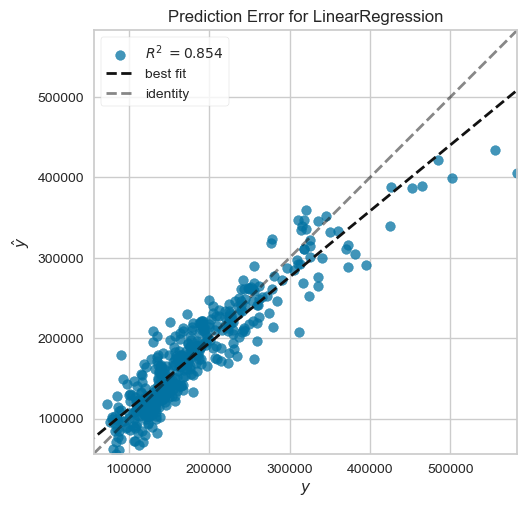

<AxesSubplot:title={'center':'Prediction Error for LinearRegression'}, xlabel='$y$', ylabel='$\\hat{y}$'>

In [503]:
# now we will check the accuracy by visualization
from yellowbrick.regressor import PredictionError,ResidualsPlot
v=PredictionError(LR1).fit(x1_train,y_train)
v.score(x1_test,y_test)
v.poof()

In [504]:
# by using PCA we can compress the input data 
from sklearn.decomposition import PCA

In [505]:
# by n_components we can decide how many input columns should be there
pc=PCA(n_components=2)
x_PCA_train= pc.fit_transform(x1_train)
x_PCA_test= pc.transform(x1_test)

In [506]:
LR=LinearRegression()
LR2=LR.fit(x_PCA_train,y_train)
y_LR2_pred=LR2.predict(x_PCA_test)
print("r2_score : ",r2_score(y_test,y_LR2_pred))
print("mean_squared_error : ",mean_squared_error(y_test,y_LR2_pred))

r2_score :  0.8244809052184174
mean_squared_error :  1054754922.7806323


In [ ]:
#model 3
#here we remove 3 more columns from our input data set

In [508]:
x1_train.columns

Index(['OverallQual', 'ExterQual', 'BsmtQual', 'TotalBsmtSF', '1stFlrSF',
       'GrLivArea', 'KitchenQual', 'GarageCars', 'GarageArea'],
      dtype='object')

In [509]:
x2_train=x1_train.drop(columns=['ExterQual', 'BsmtQual','KitchenQual'])
x2_test=x1_test.drop(columns=['ExterQual', 'BsmtQual','KitchenQual'])

In [510]:
print(x2_train.shape,x2_test.shape)

(988, 6) (424, 6)


In [511]:
LR=LinearRegression()
LR2=LR.fit(x2_train,y_train)
y_LR2_pred=LR2.predict(x2_test)
print("r2_score : ",r2_score(y_test,y_LR2_pred))
print("mean_squared_error : ",mean_squared_error(y_test,y_LR2_pred))

r2_score :  0.8157484636801213
mean_squared_error :  1107231183.0523343
